0. Previous steps.

0.1. Importing packages.

In [69]:
#Importing Packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pycountry

0.2. Importing the dataframes.

In [70]:
#Importing the dataframes

#Main ones

general_data = pd.DataFrame(pd.read_excel(".../general_data.xlsx", sheet_name='Data'))
data_ghg_emissions = pd.DataFrame(pd.read_excel(".../data_ghg_emissions.xlsx", sheet_name='Data'))
data_climate_change = pd.DataFrame(pd.read_excel(".../climate_change_data.xlsx", sheet_name='Data'))
data_temp_change_land_per_country_month = pd.DataFrame(pd.read_excel(".../data_temperature_change_land.xlsx", sheet_name='Data'))
data_ocean_heat_anomalities_per_region = pd.DataFrame(pd.read_excel(".../data_ocean_temperature_anomalies.xlsx", sheet_name='Data'))

1. Analysis of General Data

1.1. Drawing a heatmap.

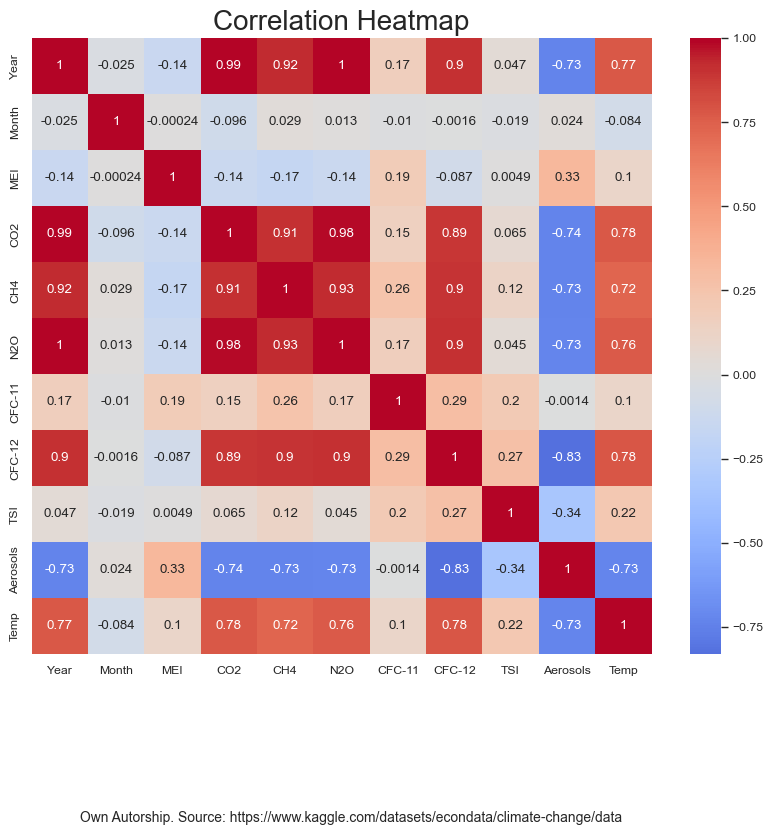

In [71]:
#Correlation map (General Data)

corr_general_data = general_data.corr(method='spearman')

note = 'Own Autorship. Source: https://www.kaggle.com/datasets/econdata/climate-change/data'

sns.set_context('paper')
sns.set_style('darkgrid')

plt.figure(figsize=(10, 8))
sns.heatmap(corr_general_data, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap', fontsize=20)
plt.figtext(0.445, -0.1, note, ha="center", fontsize=10)
plt.show()

1.2. Plotting correlations.

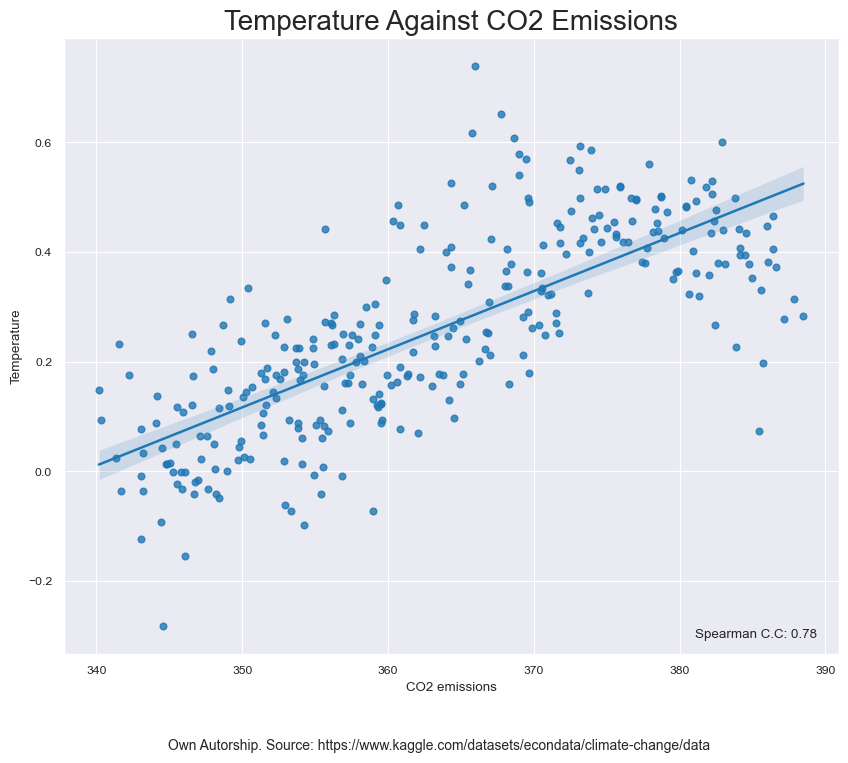

In [72]:
#Temperature against CO2 emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='CO2', y='Temp', data=general_data)
plt.title('Temperature Against CO2 Emissions', fontsize=20)
plt.xlabel('CO2 emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: 0.78')
plt.show()

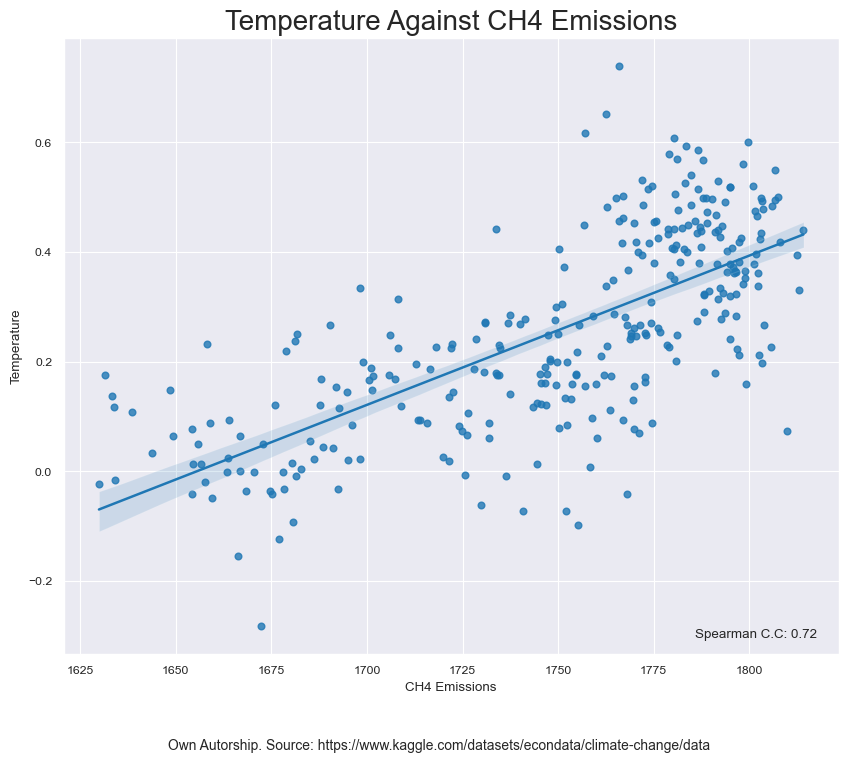

In [73]:
#Temperature against CH4 emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='CH4', y='Temp', data=general_data)
plt.title('Temperature Against CH4 Emissions', fontsize=20)
plt.xlabel('CH4 Emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: 0.72')
plt.show()

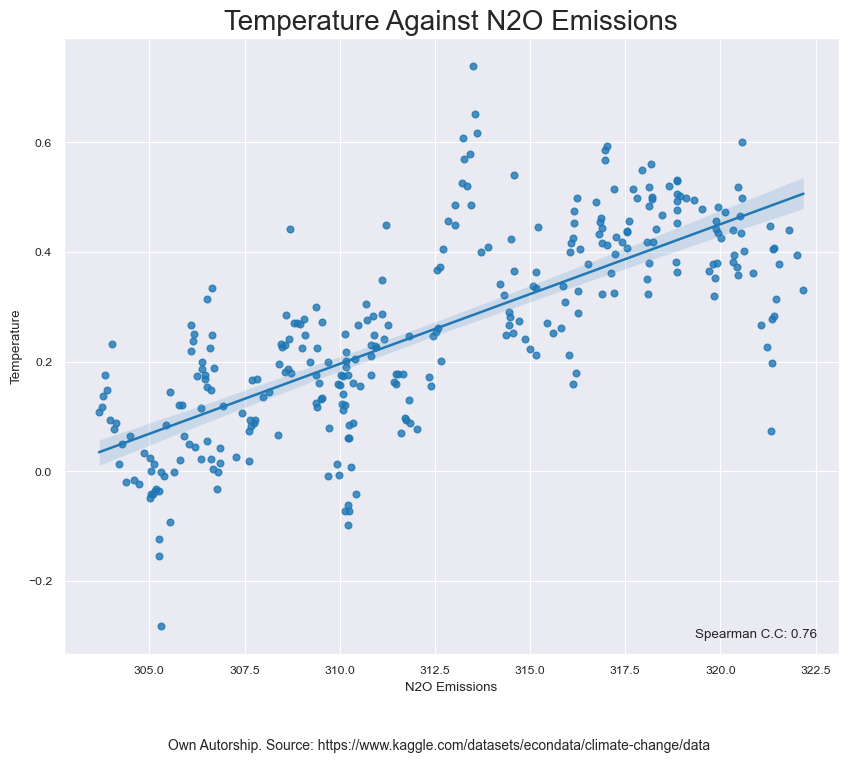

In [74]:
#Plotting Temperature against N2O emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='N2O', y='Temp', data=general_data)
plt.title('Temperature Against N2O Emissions', fontsize=20)
plt.xlabel('N2O Emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: 0.76')
plt.show()

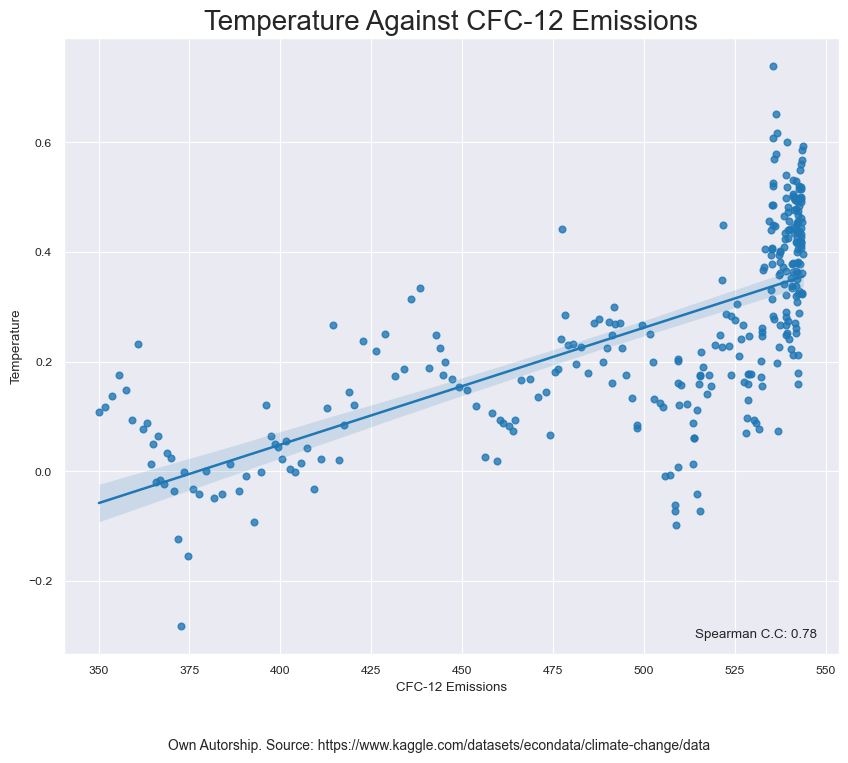

In [75]:
#Plotting Temperature against CFC-12 emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='CFC-12', y='Temp', data=general_data)
plt.title('Temperature Against CFC-12 Emissions', fontsize=20)
plt.xlabel('CFC-12 Emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: 0.78')
plt.show()

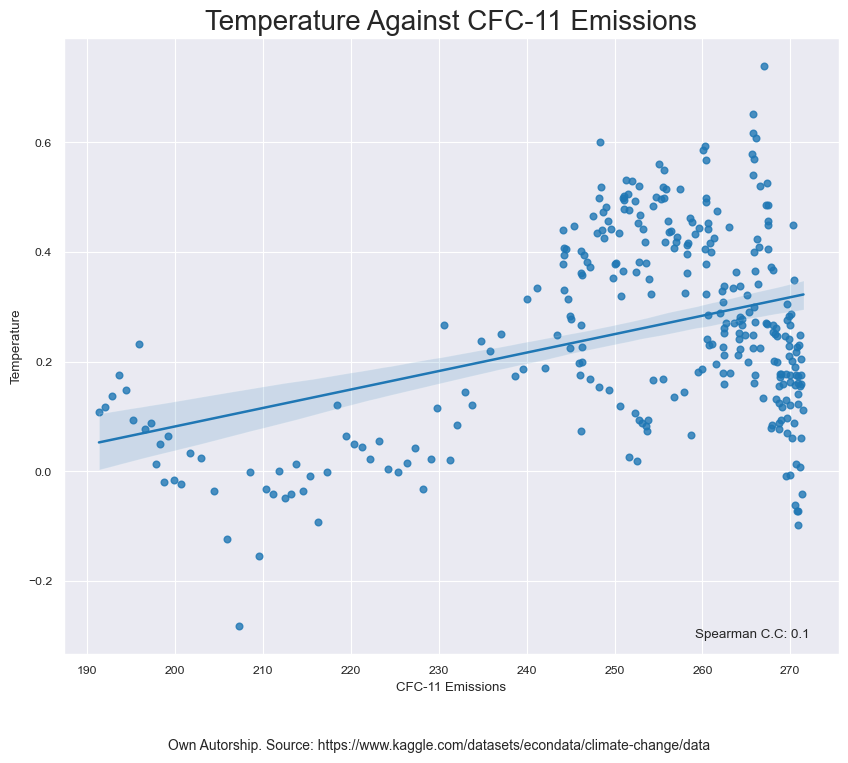

In [76]:
#Plotting Temperature against CFC-11 emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='CFC-11', y='Temp', data=general_data)
plt.title('Temperature Against CFC-11 Emissions', fontsize=20)
plt.xlabel('CFC-11 Emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: 0.1')
plt.show()

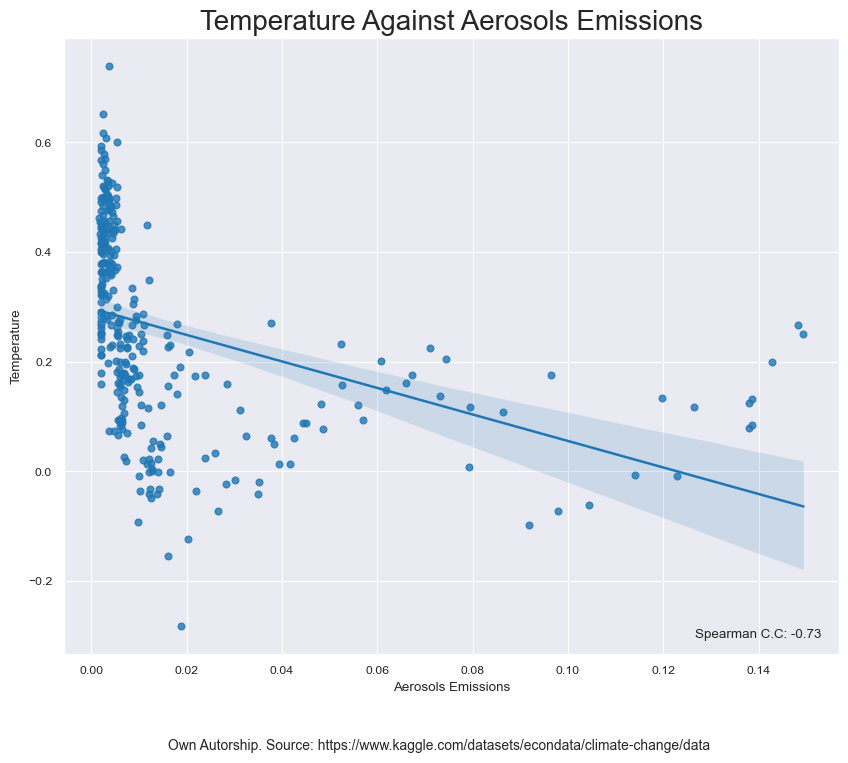

In [77]:
#Plotting Temperature against Aerosols emissions

plt.figure(figsize=(10, 8))
sns.regplot(x='Aerosols', y='Temp', data=general_data)
plt.title('Temperature Against Aerosols Emissions', fontsize=20)
plt.xlabel('Aerosols Emissions')
plt.ylabel('Temperature')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.figtext(0.756, 0.13, 'Spearman C.C: -0.73')
plt.show()

1.3. Visualizing the variability of MEI and TSI against temperature.

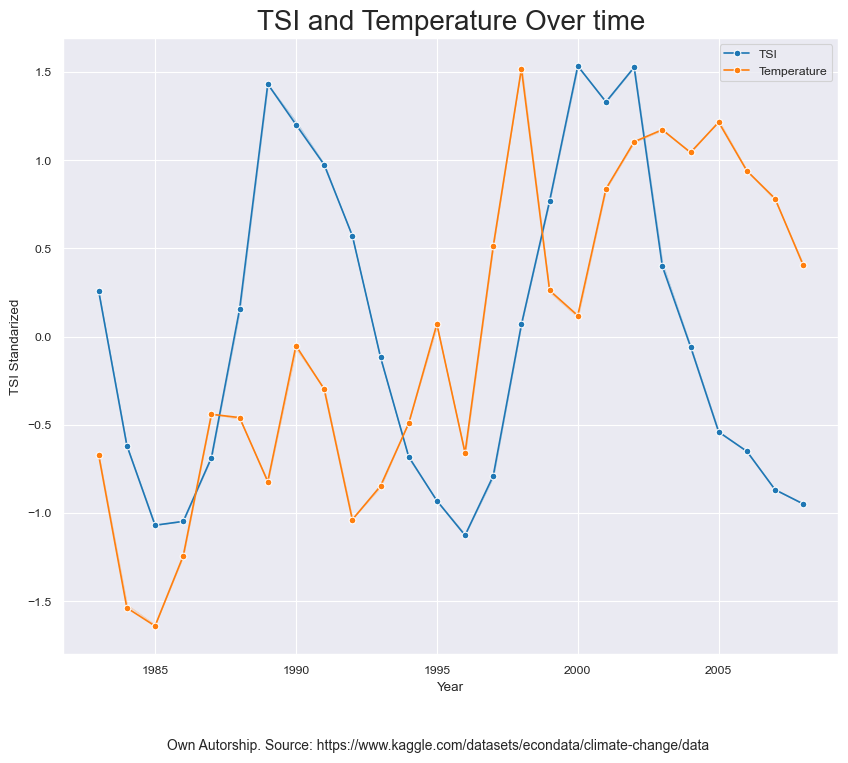

In [78]:
#Plotting solar irradiance and temperature

#Standarize the variables to we can compare it properly

plt.figure(figsize=(10,8))
general_data_stdrized = general_data
general_data_stdrized['TSI Standarized'] = (general_data['TSI'] - general_data['TSI'].mean()) / general_data['TSI'].std()
general_data_stdrized['Temp Standarized'] = (general_data['Temp'] - general_data['Temp'].mean()) / general_data['Temp'].std()

sns.lineplot(x='Year', y='TSI Standarized', data=general_data_stdrized, label='TSI', marker='o', errorbar=('ci', False))
sns.lineplot(x='Year', y='Temp Standarized', data=general_data_stdrized, label='Temperature', marker='o', errorbar=('ci', False))
plt.title('TSI and Temperature Over time', fontsize=20)
plt.legend()
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.show()

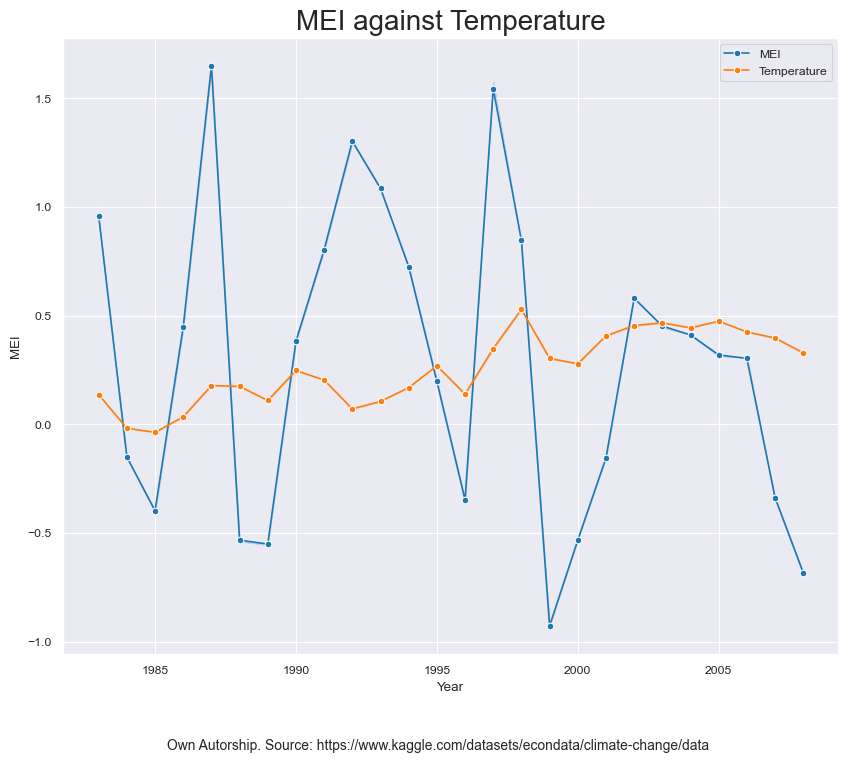

In [79]:
#Plotting MEI against Temperature

plt.figure(figsize=(10, 8))
sns.lineplot(x='Year', y='MEI', data=general_data, label='MEI', marker='o', errorbar=('ci', False))
sns.lineplot(x='Year', y='Temp', data=general_data, label='Temperature', marker='o', errorbar=('ci', False))
plt.title('MEI against Temperature', fontsize=20)
plt.legend()
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.show()

2. Analisis of data_ghg_emissions & data_temp_change_land_per_country_month.

2.1. Creating world charts in order to analyze the origin of the emissions.

2.1.1. Data modeling and previous preparation.

In [82]:
#Data manipulation

import geopandas as gpd

##Standardizing country names

def standardize_country_name(name):
    try:
        country = pycountry.countries.lookup(name)
        return country.name
    except LookupError:
        return name

world = gpd.read_file("C:/Users/usuario/OneDrive/Escritorio/world/ne_110m_admin_0_countries.shp")

world['SOVEREIGNT'] = world['SOVEREIGNT'].apply(standardize_country_name)

data_ghg_emissions['country'] = data_ghg_emissions['country'].apply(standardize_country_name)

##Filtering dataframes

world_filtered = world[['SOVEREIGNT', 'geometry']]

data_ghg_emissions_2020 = data_ghg_emissions[data_ghg_emissions['year'] == 2020]

data_ghg_emissions_2020_filtered = data_ghg_emissions_2020[['country', 'co2', 'co2_per_capita', 'methane', 'methane_per_capita', 'nitrous_oxide', 'nitrous_oxide_per_capita', 'total_ghg', 'ghg_per_capita']]

data_map = world_filtered.merge(data_ghg_emissions_2020_filtered, how='left', left_on='SOVEREIGNT', right_on='country')

gdf = gpd.GeoDataFrame(data_map, geometry='geometry')

gdf = gdf[gdf['geometry'].notnull()]

2.1.2. Developing the visualizations.

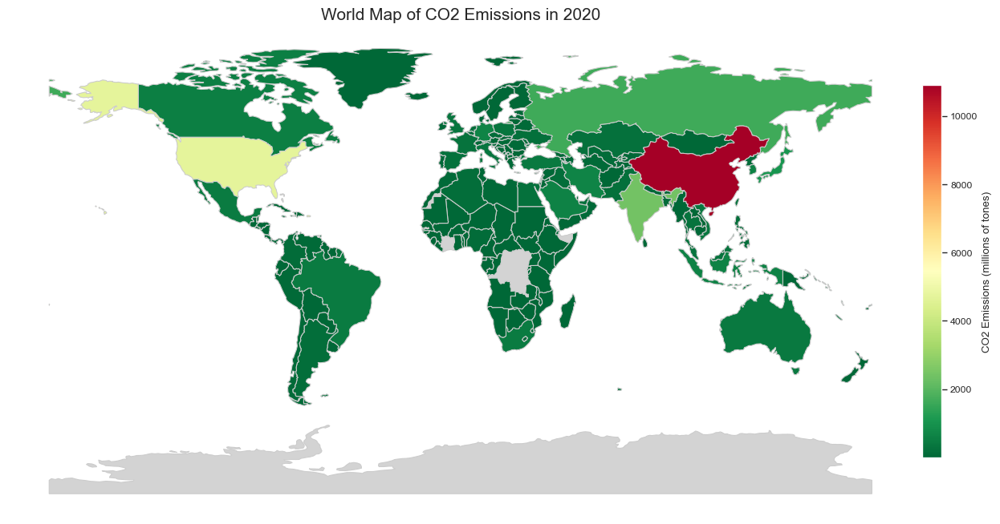

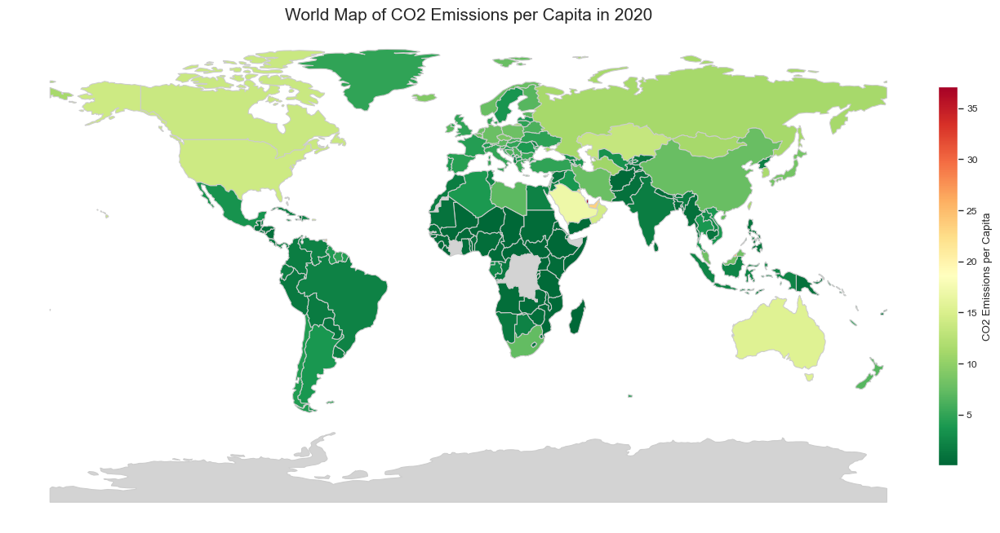

In [83]:
#Creating the map for CO2 emissions

note = 'Own Autorship. Source: https://github.com/owid/co2-data'

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='co2', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['co2'].min(), vmax=gdf['co2'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('CO2 Emissions (millions of tones)')

plt.title('World Map of CO2 Emissions in 2020', fontsize=15)

ax.set_axis_off()

plt.show()

#Creating the map for CO2 emissions per capita

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='co2_per_capita', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['co2_per_capita'].min(), vmax=gdf['co2_per_capita'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('CO2 Emissions per Capita')

plt.title('World Map of CO2 Emissions per Capita in 2020', fontsize=15)

ax.set_axis_off()

plt.show()

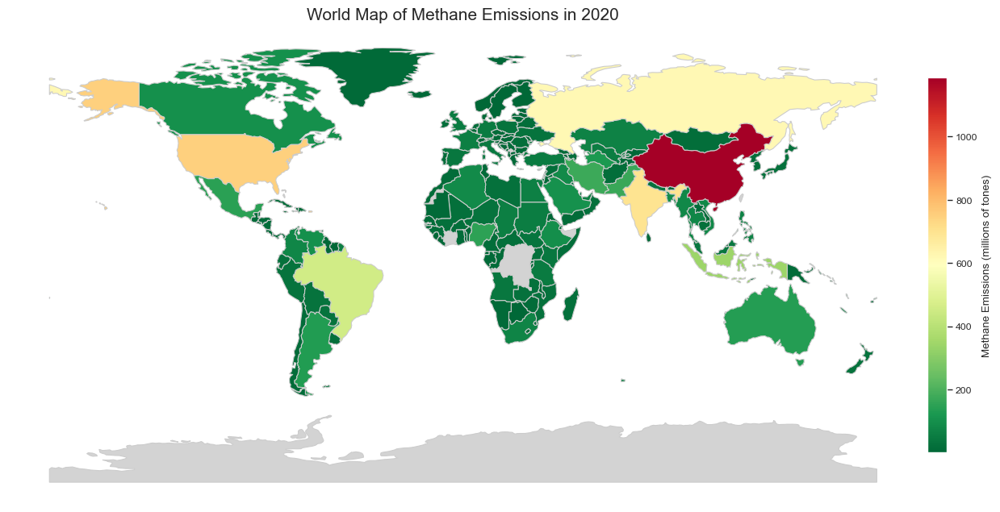

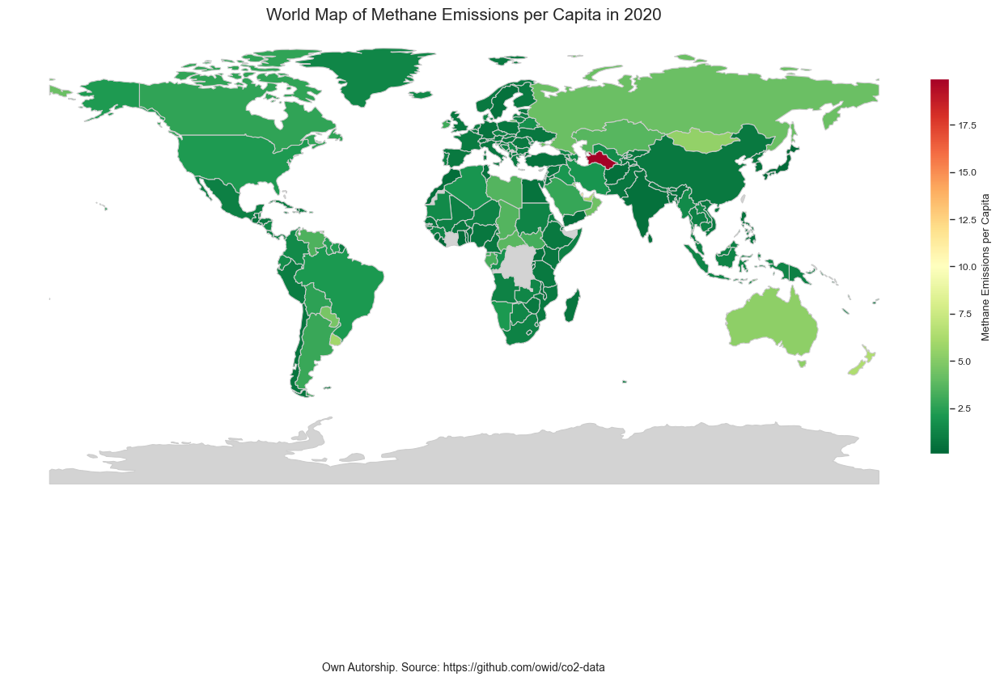

In [84]:
#Creating the map for Methane emissions

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='methane', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['methane'].min(), vmax=gdf['methane'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Methane Emissions (millions of tones)')

plt.title('World Map of Methane Emissions in 2020', fontsize=15)

ax.set_axis_off()

plt.show()

#Creating the map for CO2 emissions per capita

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='methane_per_capita', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['methane_per_capita'].min(), vmax=gdf['methane_per_capita'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Methane Emissions per Capita')

plt.title('World Map of Methane Emissions per Capita in 2020', fontsize=15)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
ax.set_axis_off()

plt.show()

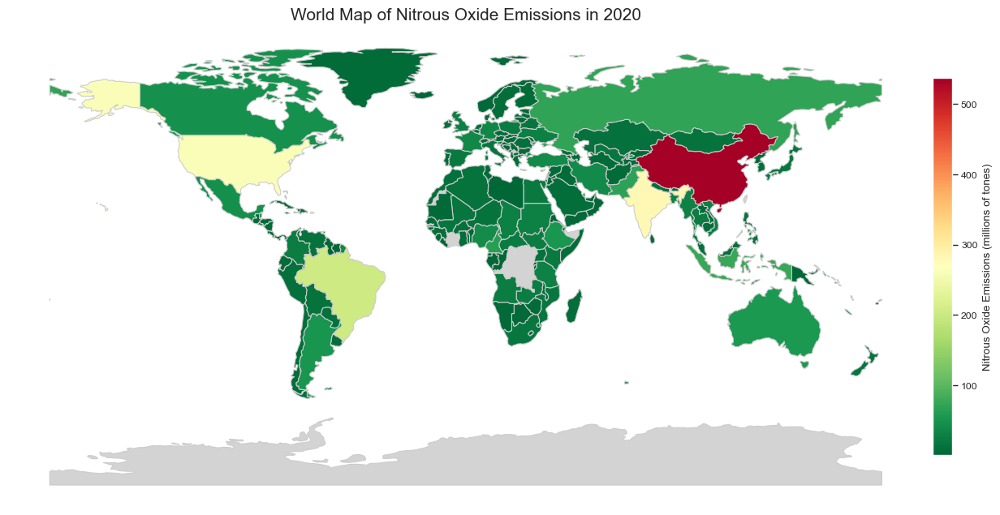

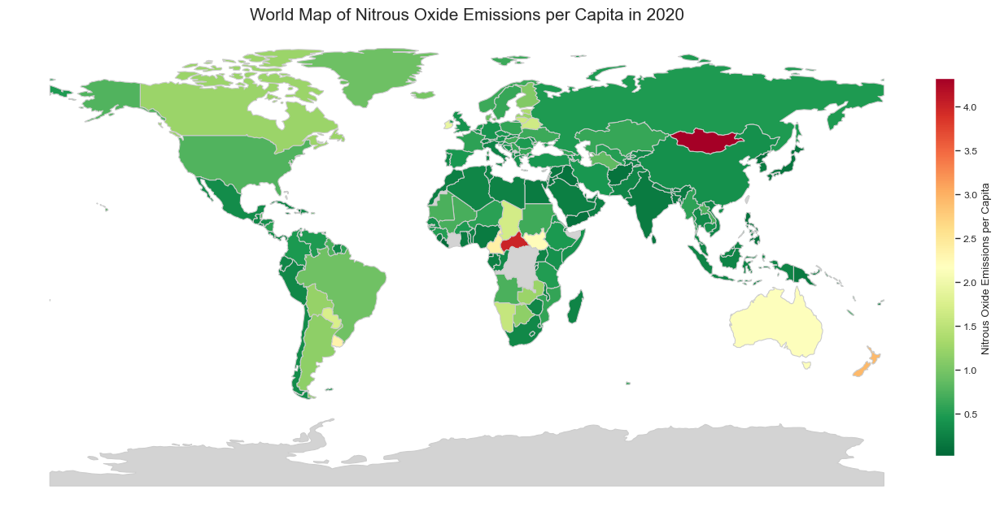

In [85]:
#Creating the map for CO2 emissions

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='nitrous_oxide', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['nitrous_oxide'].min(), vmax=gdf['nitrous_oxide'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Nitrous Oxide Emissions (millions of tones)')

plt.title('World Map of Nitrous Oxide Emissions in 2020', fontsize=15)

ax.set_axis_off()

plt.show()

#Creating the map for CO2 emissions per capita

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='nitrous_oxide_per_capita', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['nitrous_oxide_per_capita'].min(), vmax=gdf['nitrous_oxide_per_capita'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Nitrous Oxide Emissions per Capita')

plt.title('World Map of Nitrous Oxide Emissions per Capita in 2020', fontsize=15)

ax.set_axis_off()

plt.show()

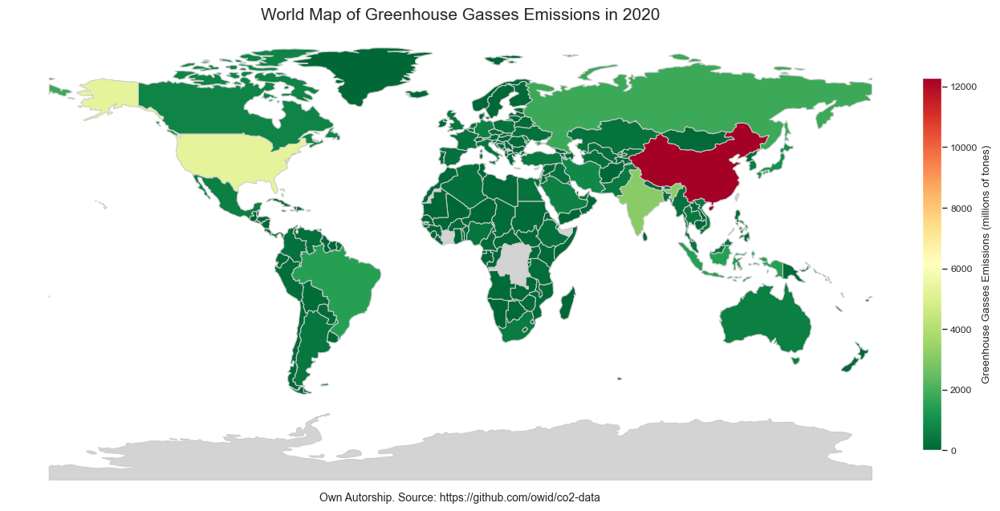

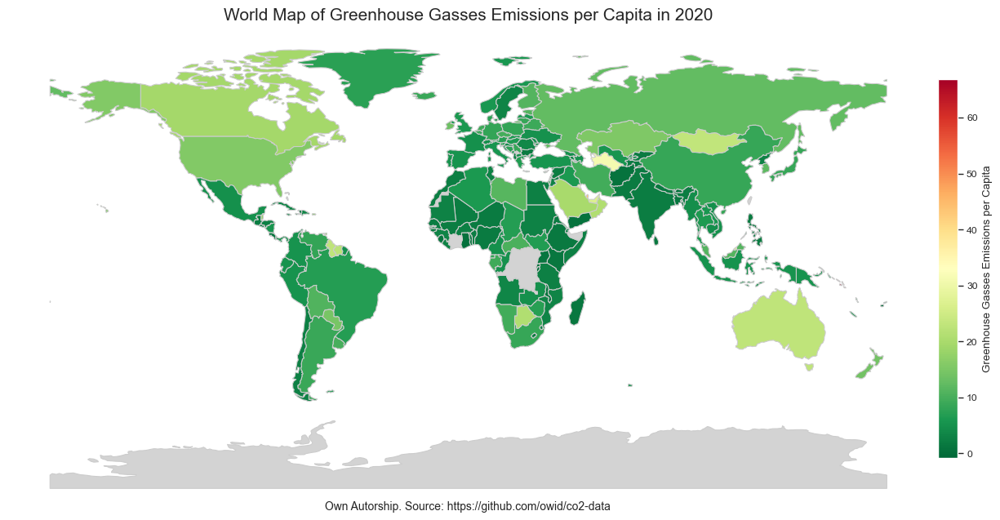

In [86]:
#Creating the map for CO2 emissions

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='total_ghg', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['total_ghg'].min(), vmax=gdf['total_ghg'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Greenhouse Gasses Emissions (millions of tones)')

plt.title('World Map of Greenhouse Gasses Emissions in 2020', fontsize=15)
plt.figtext(0.5, 0.2, note, ha='center', fontsize=10)

ax.set_axis_off()

plt.show()

#Creating the map for CO2 emissions per capita

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf.plot(column='ghg_per_capita', cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', missing_kwds={'color': 'lightgrey'})

sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=gdf['ghg_per_capita'].min(), vmax=gdf['ghg_per_capita'].max()))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.01)
cbar.set_label('Greenhouse Gasses Emissions per Capita')

plt.title('World Map of Greenhouse Gasses Emissions per Capita in 2020', fontsize=15)
plt.figtext(0.5, 0.2, note, ha='center', fontsize=10)
ax.set_axis_off()

plt.show()

2.2. Visualizing proportionally the total global emissions of GHG.

2.2.1. Data modeling and preparation.

In [87]:
countries = [
    'Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Anguilla', 'Antarctica',
    'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan',
    'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
    'Bermuda', 'Bhutan', 'Bolivia, Plurinational State of', 'Bonaire Sint Eustatius and Saba',
    'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Virgin Islands, British', 'Brunei', 'Bulgaria',
    'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Central African Republic',
    'Chad', 'Chile', 'China', 'Christmas Island', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
    'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czechia',
    'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'East Timor',
    'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia',
    'Faroe Islands', 'Fiji', 'Finland', 'France', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia',
    'Germany', 'Ghana', 'Greece', 'Greenland', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau',
    'Guyana', 'Haiti', 'Honduras', 'Hong Kong', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran, Islamic Republic of',
    'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya',
    'Kiribati', 'Kosovo', 'Kuwait', 'Kuwaiti Oil Fires', 'Kyrgyzstan', "Lao People's Democratic Republic",
    'Latvia', 'Lebanon', 'Leeward Islands', 'Lesotho', 'Liberia', 'Libya', 'Liechtenstein', 'Lithuania',
    'Luxembourg', 'Macao', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta',
    'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia (country)', 'Moldova, Republic of',
    'Monaco', 'Mongolia', 'Montenegro', 'Montserrat', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia',
    'Nauru', 'Nepal', 'Netherlands', 'New Caledonia', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria',
    'Niue', "Korea, Democratic People's Republic of", 'North Macedonia', 'Norway', 'Oman', 'Pakistan',
    'Palau', 'Palestine', 'Panama', 'Panama Canal Zone', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines',
    'Poland', 'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Ryukyu Islands', 'Saint Helena',
    'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Pierre and Miquelon', 'Saint Vincent and the Grenadines',
    'Samoa', 'San Marino', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles',
    'Sierra Leone', 'Singapore', 'Sint Maarten (Dutch part)', 'Slovakia', 'Slovenia', 'Solomon Islands',
    'Somalia', 'South Africa', 'Korea, Republic of', 'South Sudan', 'Spain', 'Sri Lanka',
    'St. Kitts-Nevis-Anguilla', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syrian Arab Republic',
    'Taiwan, Province of China', 'Tajikistan', 'Tanzania, United Republic of', 'Thailand', 'Togo',
    'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Turks and Caicos Islands',
    'Tuvalu', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States',
    'Uruguay', 'Uzbekistan', 'Vanuatu', 'Vatican', 'Venezuela, Bolivarian Republic of', 'Viet Nam',
    'Wallis and Futuna', 'Yemen', 'Zambia', 'Zimbabwe'
]

data_ghg_emissions_2020_filtered = data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(countries)]

var = ['co2', 'co2_per_capita', 'methane', 'methane_per_capita', 'nitrous_oxide', 'nitrous_oxide_per_capita', 'total_ghg', 'ghg_per_capita']

for variable in var:
    data_ghg_emissions_2020_filtered[variable + '_percentage'] = data_ghg_emissions_2020_filtered[variable]*100 / data_ghg_emissions_2020_filtered[variable].sum()

2.2.2. Developing the visualizations.

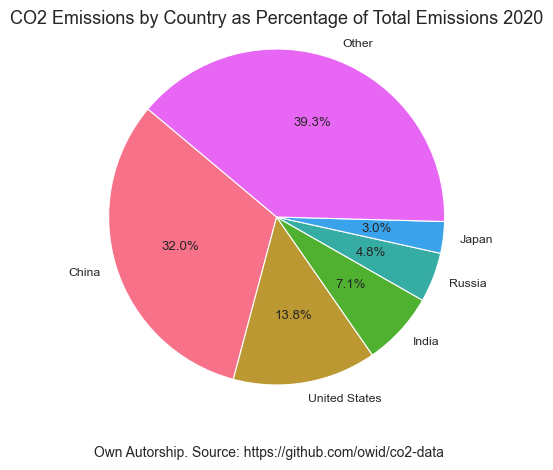

In [88]:
#Creating a Pie Chart for CO2

##Previously required manipulation and adaptation

co2_pie_plot_df = data_ghg_emissions_2020_filtered[['country', 'co2_percentage']].sort_values(by='co2_percentage', ascending=False)

other_per_co2 = 100 - co2_pie_plot_df['co2_percentage'].head(5).sum()

new_obs = pd.DataFrame({'country': ['Other'], 'co2_percentage': [other_per_co2]})

co2_pie_plot_df_5 = co2_pie_plot_df.head(5)

co2_pie_plot_df_other = pd.concat([co2_pie_plot_df_5, new_obs])

##Plotting the pie for CO2

note = 'Own Autorship. Source: https://github.com/owid/co2-data'

labels = co2_pie_plot_df_other['country'].to_list()
sizes = co2_pie_plot_df_other['co2_percentage'].to_list()
colors = sns.color_palette('husl')

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('CO2 Emissions by Country as Percentage of Total Emissions 2020', fontsize=13)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.show()

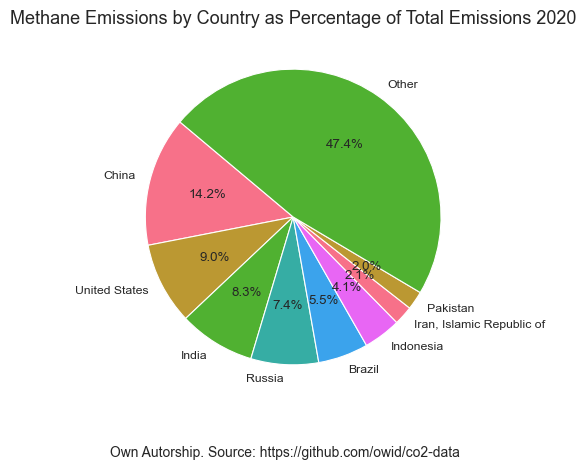

In [89]:
#Creating a pie plot for methane emissions

##Previously required data manipulation and adaptation

methane_pie_plot_df = data_ghg_emissions_2020_filtered[['country', 'methane_percentage']].sort_values(by='methane_percentage', ascending=False)

other_per_methane = 100 - methane_pie_plot_df['methane_percentage'].head(8).sum()

new_obs = pd.DataFrame({'country':['Other'], 'methane_percentage':[other_per_methane]})

methane_pie_plot_df_5 = methane_pie_plot_df.head(8)

methane_pie_plot_df_5_other = pd.concat([methane_pie_plot_df_5, new_obs])

##Creating a pie plot for methane emissions

sizes = methane_pie_plot_df_5_other['methane_percentage'].to_list()
labels = methane_pie_plot_df_5_other['country'].to_list()
colors = sns.color_palette('husl')

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Methane Emissions by Country as Percentage of Total Emissions 2020', fontsize=13)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.show()



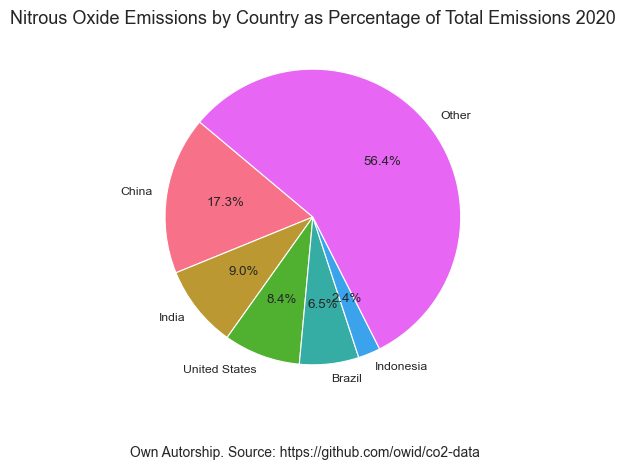

In [90]:
#Creating a pie chart for nitroux oxide emissions

##Previously required data manipulation and modifications

nitroux_oxide_emissions = data_ghg_emissions_2020_filtered[['country', 'nitrous_oxide_percentage']].sort_values(by='nitrous_oxide_percentage', ascending=False)

other_per_nitrous_oxide = 100 - nitroux_oxide_emissions['nitrous_oxide_percentage'].head(5).sum()

new_obs = pd.DataFrame({'country':['Other'], 'nitrous_oxide_percentage':[other_per_nitrous_oxide]})

nitroux_oxide_emissions_5 = nitroux_oxide_emissions.head(5)

nitroux_oxide_emissions_5_other = pd.concat([nitroux_oxide_emissions_5, new_obs])

##Plotting the pie for nitrous oxide emissions

sizes = nitroux_oxide_emissions_5_other['nitrous_oxide_percentage'].to_list()
labels = nitroux_oxide_emissions_5_other['country'].to_list()
colors = sns.color_palette('husl')

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Nitrous Oxide Emissions by Country as Percentage of Total Emissions 2020',fontsize=13)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.show()

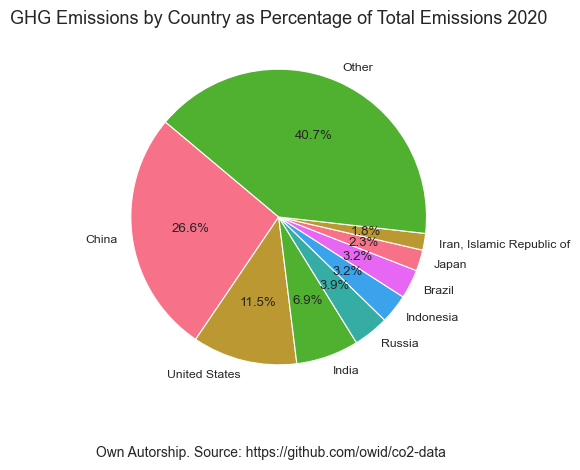

In [91]:
#Plotting GHG emissions by country

##Previously required data manipulation and modifications

ghg_emissions_pie_plot_df = data_ghg_emissions_2020_filtered[['country', 'total_ghg_percentage']].sort_values(by='total_ghg_percentage', ascending=False)

total_per_ghg = 100 - ghg_emissions_pie_plot_df['total_ghg_percentage'].head(8).sum()

new_obs = pd.DataFrame({'country':['Other'], 'total_ghg_percentage':[total_per_ghg]})

ghg_emissions_pie_plot_df_5 = ghg_emissions_pie_plot_df.head(8)

ghg_emissions_pie_plot_df_5_other = pd.concat([ghg_emissions_pie_plot_df_5, new_obs])

##Plotting the pie chart

sizes = ghg_emissions_pie_plot_df_5_other['total_ghg_percentage'].to_list()
labels = ghg_emissions_pie_plot_df_5_other['country'].to_list()
colors = sns.color_palette('husl')

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('GHG Emissions by Country as Percentage of Total Emissions 2020', fontsize=13)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.show()

2.3. Comparing Per Capita Emissions among different groups.

2.3.1. Data modeling and preparation.

In [92]:
#Previous data manipulation and other modifications

ocde = [
    'Australia', 'Austria', 'Belgium', 'Canada', 'Chile', 'Colombia', 'Czechia', 'Denmark', 'Estonia', 'Finland',
    'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Korea, Republic of',
    'Latvia', 'Lithuania', 'Luxembourg', 'Mexico', 'Netherlands', 'New Zealand', 'Norway', 'Poland', 'Portugal', 
    'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Turkey', 'United Kingdom', 'United States'
] 

europe = [
    'Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina',
    'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Faroe Islands',
    'Finland', 'France', 'Germany', 'Greece', 'Greenland', 'Hungary', 'Iceland', 'Ireland',
    'Italy', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
    'Moldova, Republic of', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway',
    'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia',
    'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican'
]

north_america = [
    'Anguilla', 'Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Bermuda',
    'Canada', 'Costa Rica', 'Cuba', 'Curacao', 'Dominica', 'Dominican Republic',
    'El Salvador', 'Greenland', 'Grenada', 'Guatemala', 'Haiti', 'Honduras',
    'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia',
    'Saint Pierre and Miquelon', 'Saint Vincent and the Grenadines', 'Sint Maarten (Dutch part)',
    'Trinidad and Tobago', 'United States'
]

south_america = [
    'Argentina', 'Bolivia, Plurinational State of', 'Brazil', 'Chile', 'Colombia', 'Ecuador',
    'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela, Bolivarian Republic of'
]

asia = [
    'Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei',
    'Cambodia', 'China', 'Georgia', 'Hong Kong', 'India', 'Indonesia', 'Iran, Islamic Republic of',
    'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan',
    "Lao People's Democratic Republic", 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia',
    'Myanmar', 'Nepal', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Saudi Arabia',
    'Singapore', 'Korea, Republic of', 'Sri Lanka',
    'Syrian Arab Republic', 'Taiwan, Province of China', 'Tajikistan', 'Thailand', 'Timor-Leste (East Timor)',
    'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'
]

africa = [
    'Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cape Verde',
    'Central African Republic', 'Chad', 'Comoros', 'Congo', "Cote d'Ivoire",
    'Democratic Republic of Congo', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea',
    'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau',
    'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
    'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda',
    'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia',
    'South Africa', 'South Sudan', 'Sudan', 'Tanzania, United Republic of', 'Togo',
    'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'
]

oceania = [
    'Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia (country)', 'Nauru',
    'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu'
]

ghg_emissions_ocde_2020 = data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(ocde)]

In [112]:
data_headed = data_ghg_emissions_2020_filtered[['country', 'ghg_per_capita']].sort_values(by='ghg_per_capita', ascending=False).head(40)
greater_emissors_ghg = data_headed['country'].to_list()

2.3.2. Developing the visualizations.

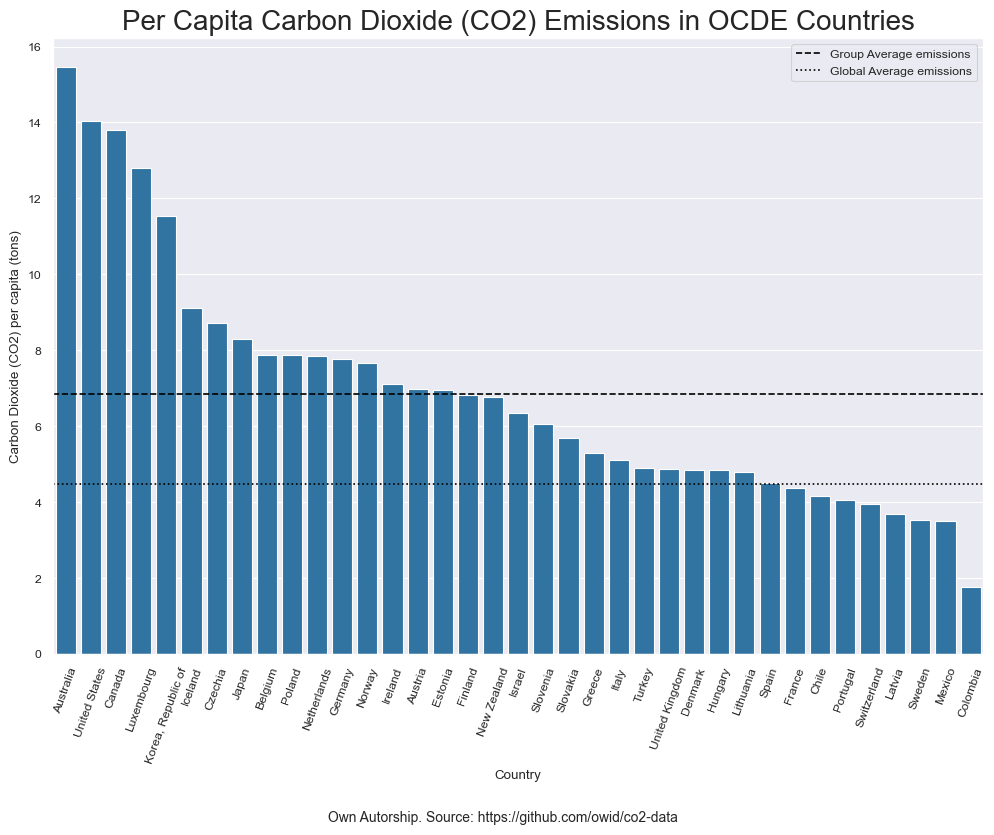

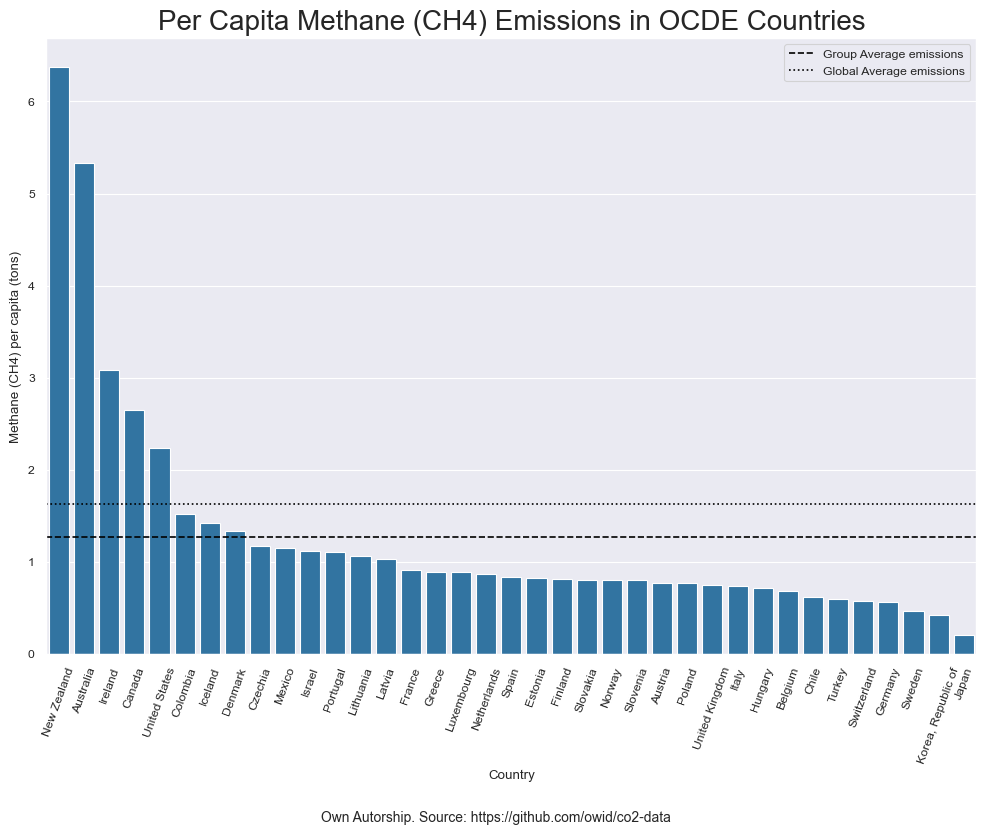

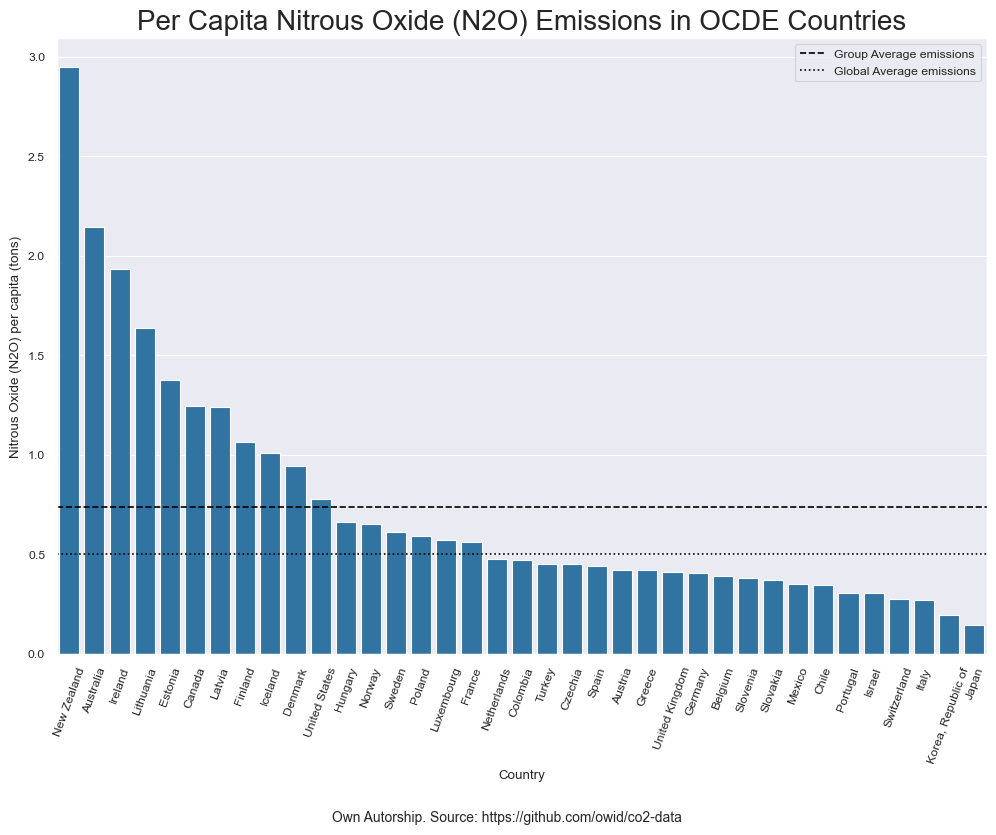

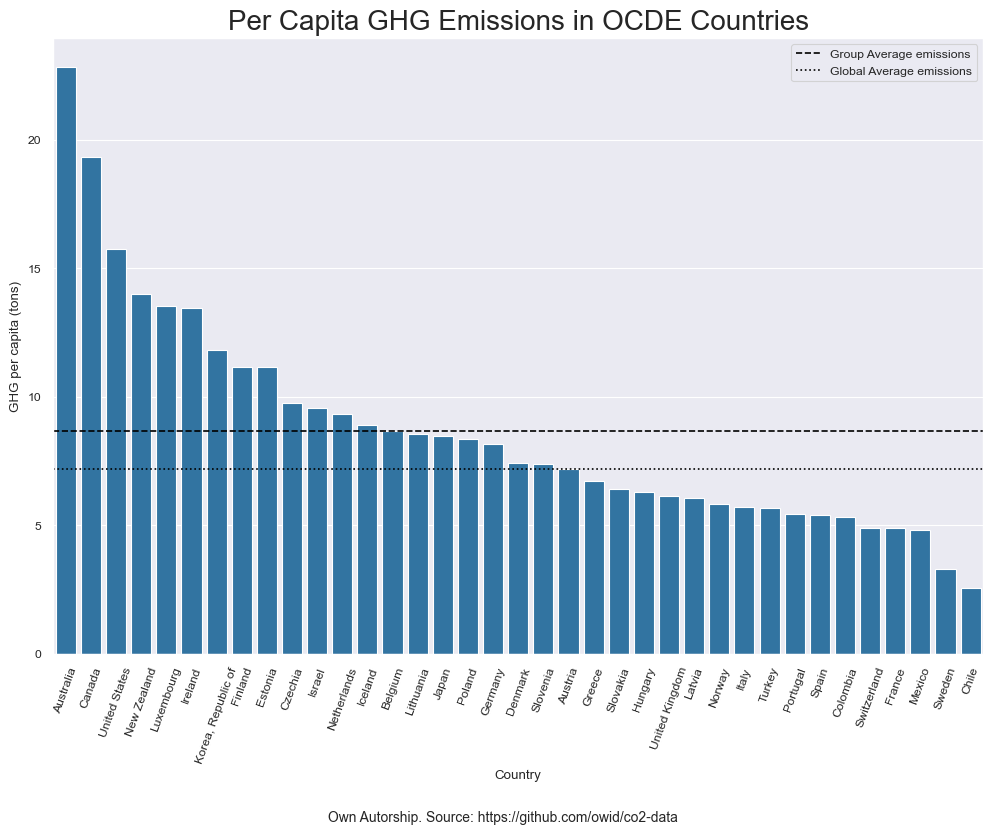

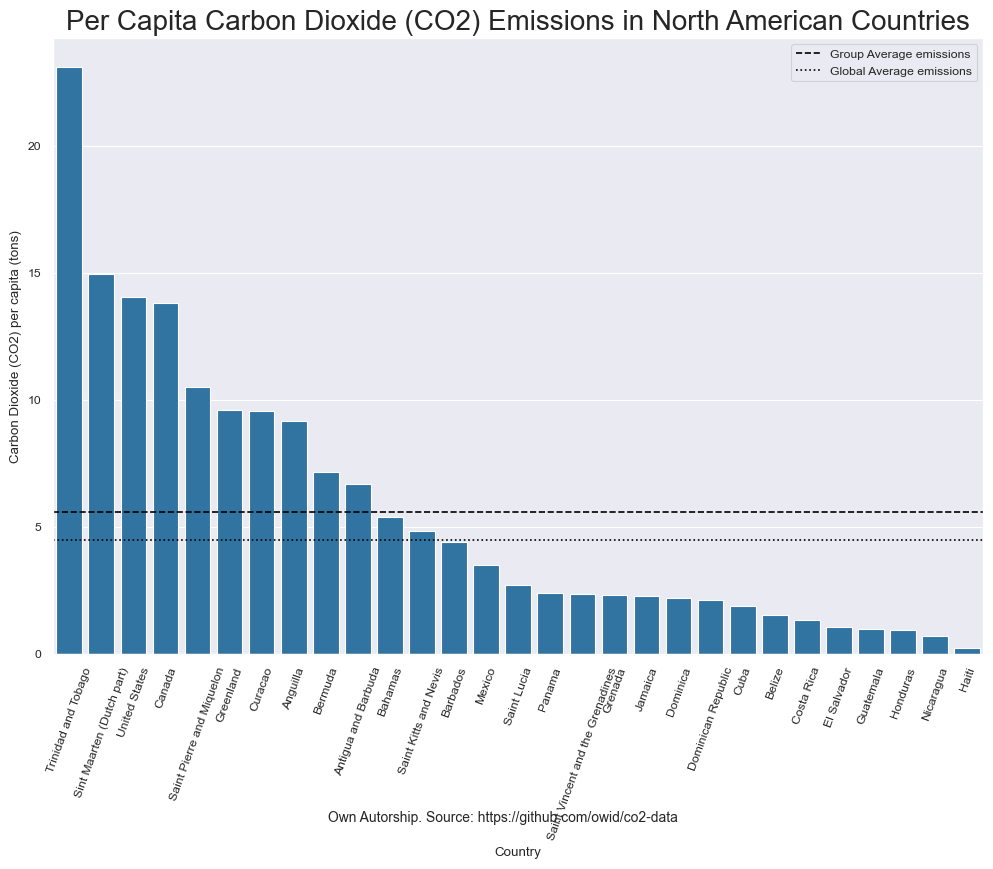

...

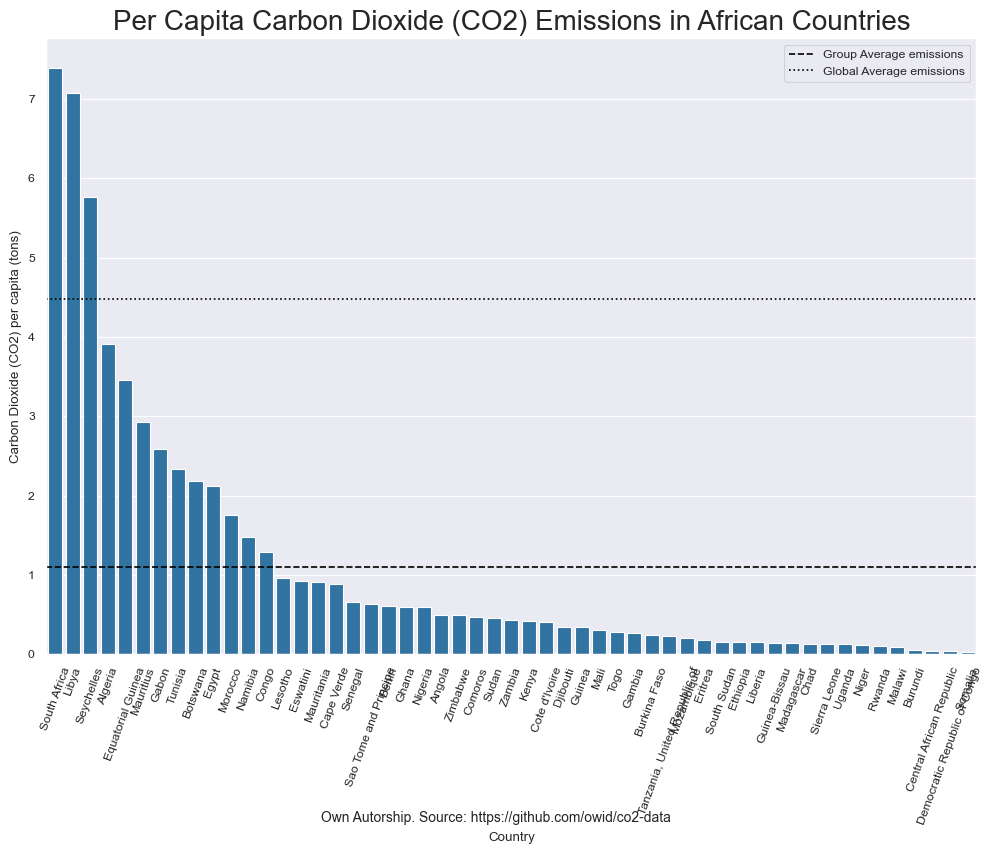

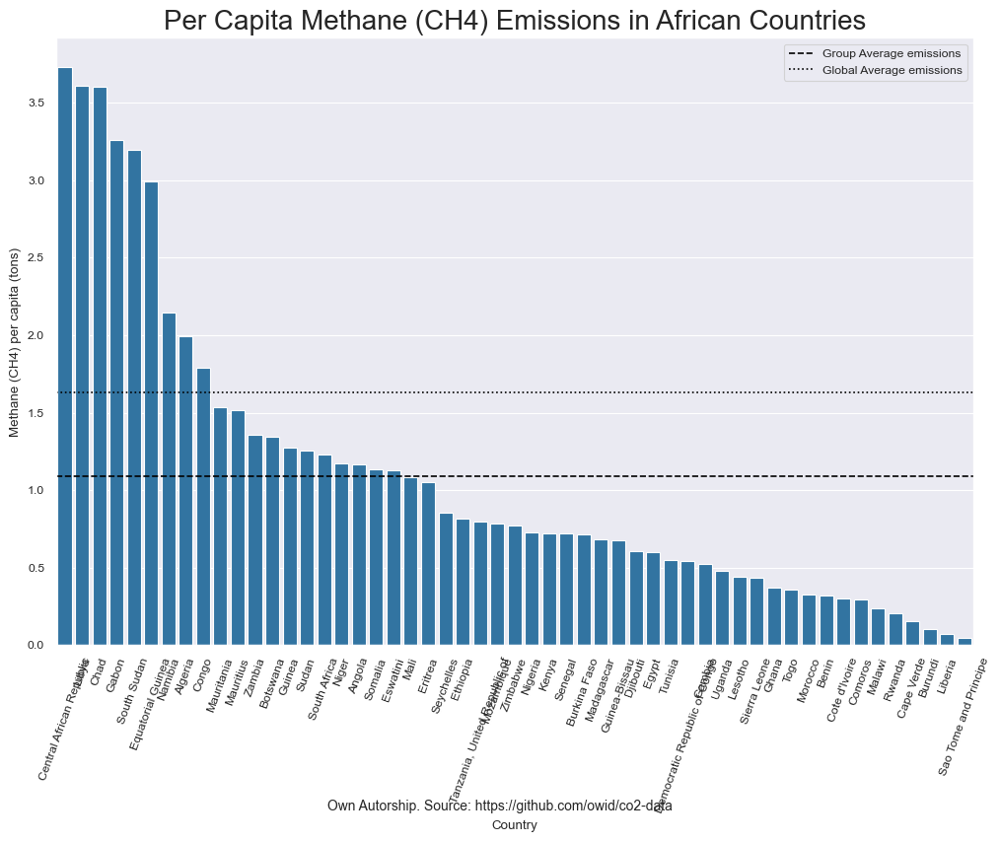

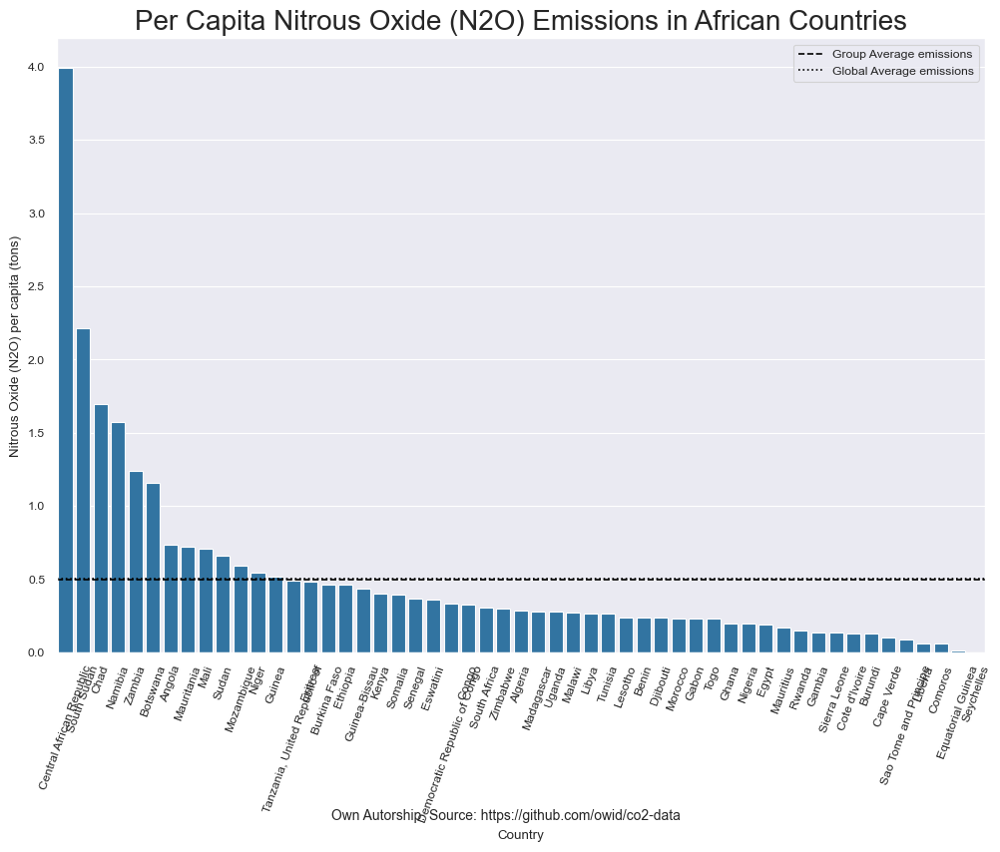

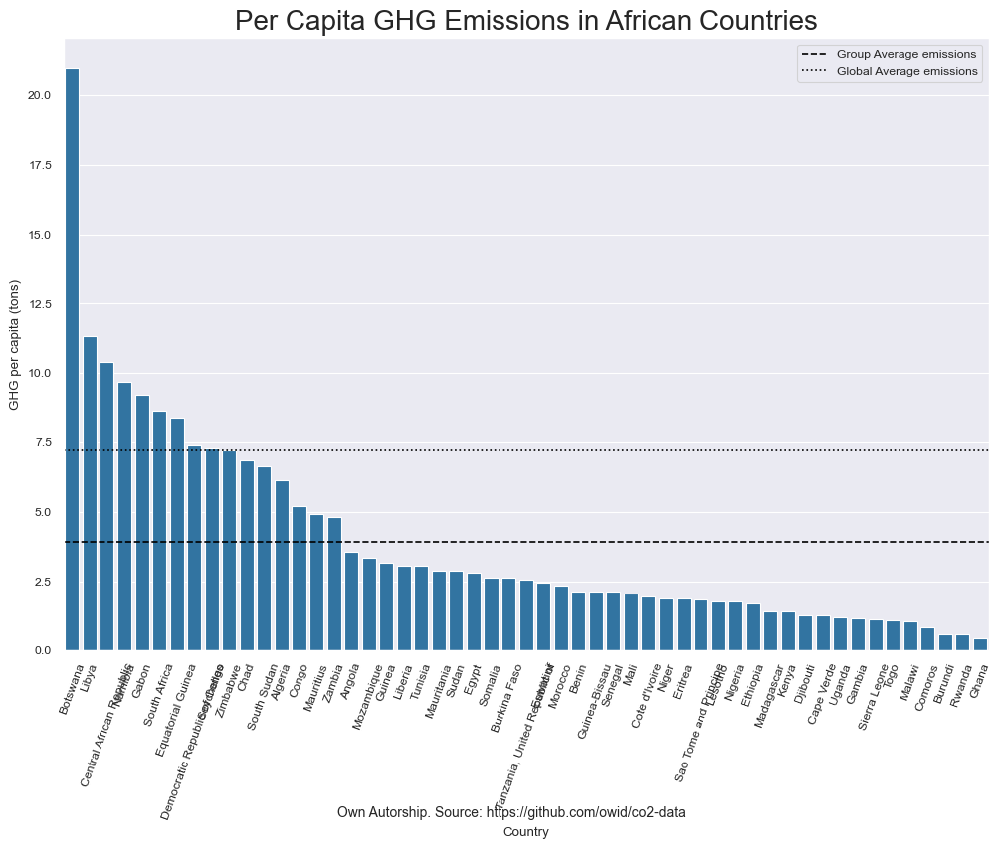

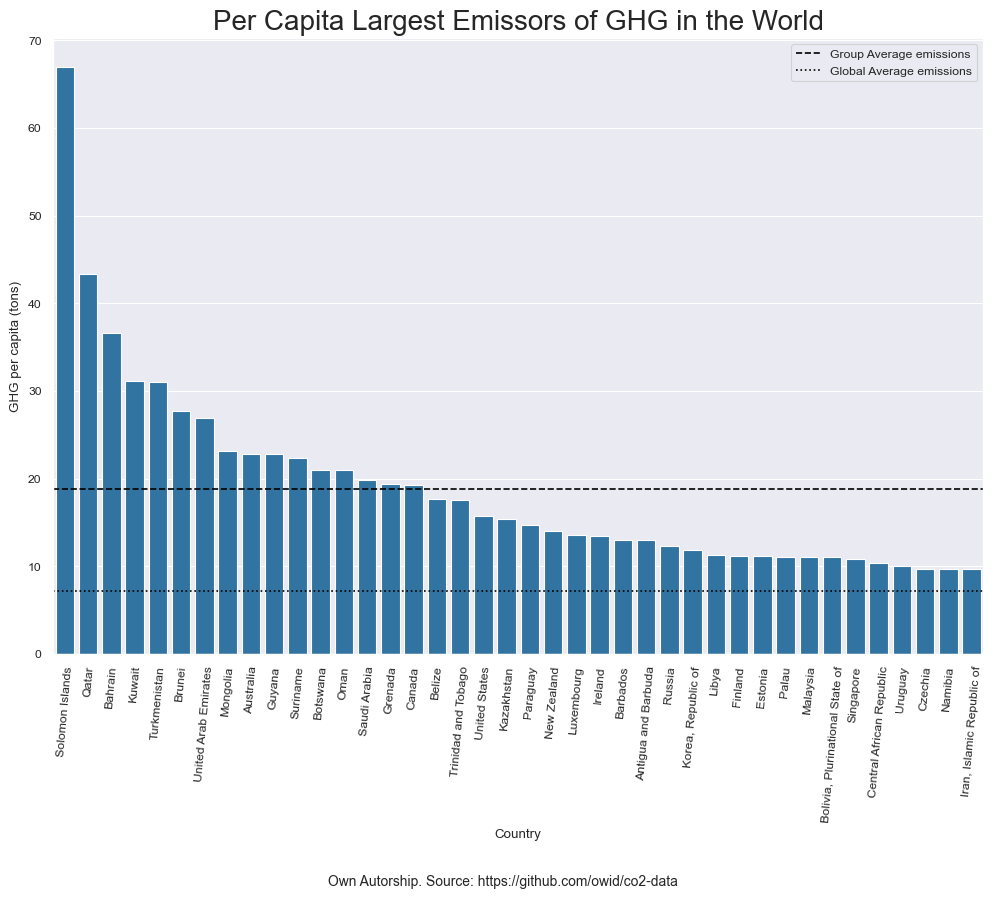

In [125]:
count_group_list = [ocde, north_america, south_america, europe, asia, oceania, africa]
list_of_var = ['co2_per_capita', 'methane_per_capita', 'nitrous_oxide_per_capita', 'ghg_per_capita']
group_name_list = ['OCDE', 'North American', 'South American', 'European', 'Asian', 'Oceanic', 'African']
gas_list = ['Carbon Dioxide (CO2)', 'Methane (CH4)', 'Nitrous Oxide (N2O)', 'GHG']

for group, g_name in zip(count_group_list, group_name_list):
    for var, gas in zip(list_of_var, gas_list):
        plt.figure(figsize=(12, 8))
        sns.barplot(x='country', y=var, data=data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(group)].sort_values(by=var, ascending=False))
        plt.xticks(rotation=70)
        plt.title(f'Per Capita {gas} Emissions in {g_name} Countries', fontsize=20)
        plt.xlabel('Country')
        plt.ylabel(f'{gas} per capita (tons)')
        plt.axhline(data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(group)][var].mean(), color='black', linestyle='--', label='Group Average emissions')
        plt.axhline(data_ghg_emissions_2020_filtered[var].mean(), color='black', linestyle=':', label='Global Average emissions')
        plt.figtext(0.5, -0.1, note, ha='center', fontsize=10)
        plt.legend()
        plt.show()

data_headed = data_ghg_emissions_2020_filtered[['country', 'ghg_per_capita']].sort_values(by='ghg_per_capita', ascending=False).head(40)
greater_emissors_ghg = data_headed['country'].to_list()

plt.figure(figsize=(12, 8))
sns.barplot(x='country', y='ghg_per_capita', data=data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(greater_emissors_ghg)].sort_values(by='ghg_per_capita', ascending=False))
plt.xticks(rotation=85)
plt.title('Per Capita Largest Emissors of GHG in the World', fontsize=20)
plt.xlabel('Country')
plt.ylabel('GHG per capita (tons)')
plt.axhline(data_ghg_emissions_2020_filtered[data_ghg_emissions_2020_filtered['country'].isin(greater_emissors_ghg)]['ghg_per_capita'].mean(), color='black', linestyle='--', label='Group Average emissions')
plt.axhline(data_ghg_emissions_2020_filtered['ghg_per_capita'].mean(), color='black', linestyle=':', label='Global Average emissions')
plt.figtext(0.5, -0.18, note, ha='center', fontsize=10)
plt.legend()
plt.show()

2.4. Analyzing the variations of the temperature imputed to each greenhouse gas.

2.4.1. Data modeling and preparation.

In [ ]:
#Data manipulation and previous modifications

data_ghg_emissions_filtered = data_ghg_emissions[['country', 'year','temperature_change_from_co2','temperature_change_from_ch4', 'temperature_change_from_n2o', 'temperature_change_from_ghg']]
data_ghg_emissions_filtered = data_ghg_emissions_filtered[data_ghg_emissions_filtered['country'].isin(countries)]

#Creating a dataframe of totals

year_list = [year for year in range(1750, 2021)]

totals_df = pd.DataFrame()

for year in year_list:
    globals()[f'total_co2_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year'] == year]['temperature_change_from_co2'].sum()
    globals()[f'total_ch4_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year'] == year]['temperature_change_from_ch4'].sum()
    globals()[f'total_n2o_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year'] == year]['temperature_change_from_n2o'].sum()
    globals()[f'temperature_change_from_ghg_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year'] == year]['temperature_change_from_ghg'].sum()

    globals()[f'totals_{year}'] = pd.DataFrame({
        'year': [year],
        'temperature_change_from_co2':[globals()[f'total_co2_{year}']],
        'temperature_change_from_ch4':[globals()[f'total_ch4_{year}']],
        'temperature_change_from_n2o':[globals()[f'total_n2o_{year}']],
        'temperature_change_from_ghg':[globals()[f'temperature_change_from_ghg_{year}']]
    })

    totals_df = pd.concat([totals_df, globals()[f'totals_{year}']])

totals_df = totals_df[totals_df['year']>=1850]

2.4.2. Developing the visualizations.

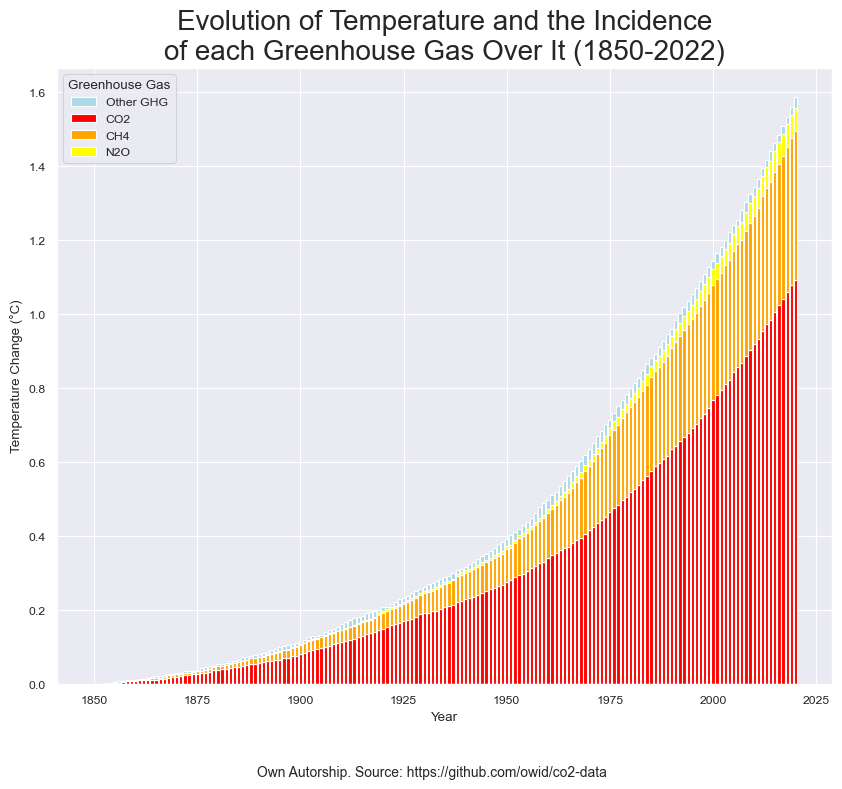

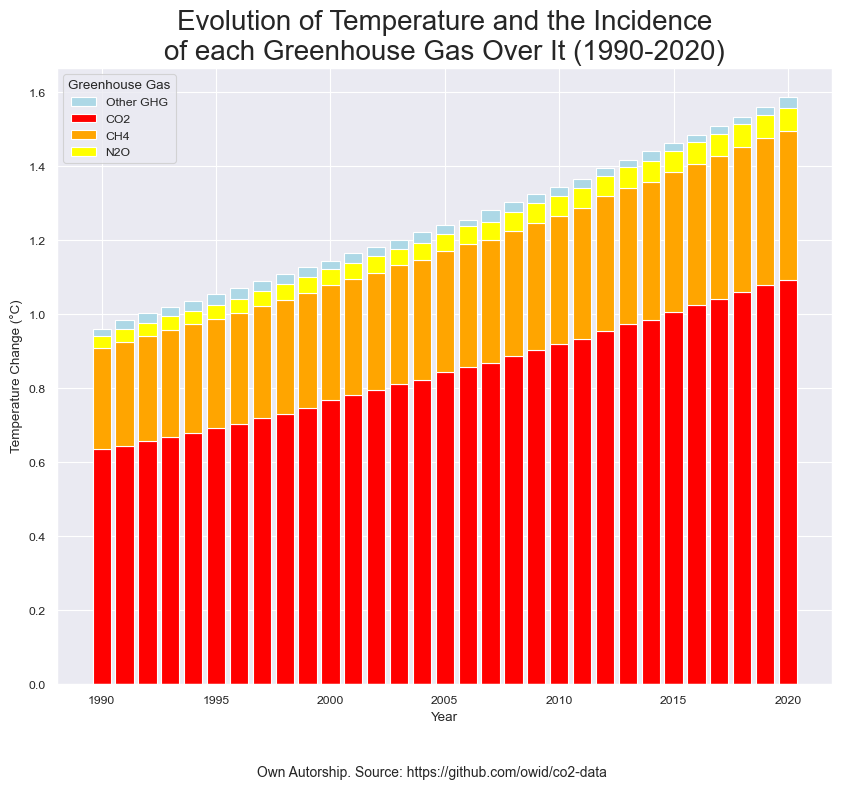

In [95]:
#Plotting the imputations of temperature changes across years

note = 'Own Autorship. Source: https://github.com/owid/co2-data'

plt.figure(figsize=(10, 8))
plt.bar(totals_df['year'], totals_df['temperature_change_from_ghg'], label='Other GHG', color='lightblue')
plt.bar(totals_df['year'], totals_df['temperature_change_from_co2'], label='CO2', color='red')
plt.bar(totals_df['year'], totals_df['temperature_change_from_ch4'], bottom=totals_df['temperature_change_from_co2'], label='CH4', color='orange')
plt.bar(totals_df['year'], totals_df['temperature_change_from_n2o'], bottom=totals_df['temperature_change_from_co2'] + totals_df['temperature_change_from_ch4'], label='N2O', color='yellow')
plt.legend(title='Greenhouse Gas')
plt.title('Evolution of Temperature and the Incidence\nof each Greenhouse Gas Over It (1850-2022)', fontsize=20)
plt.xlabel('Year')
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.ylabel('Temperature Change (°C)')
plt.show()

#Zooming the plot

totals_df = totals_df[(totals_df['year']>=1990) & (totals_df['year']<=2020)]

plt.figure(figsize=(10, 8))
plt.bar(totals_df['year'], totals_df['temperature_change_from_ghg'], label='Other GHG', color='lightblue')
plt.bar(totals_df['year'], totals_df['temperature_change_from_co2'], label='CO2', color='red')
plt.bar(totals_df['year'], totals_df['temperature_change_from_ch4'], bottom=totals_df['temperature_change_from_co2'], label='CH4', color='orange')
plt.bar(totals_df['year'], totals_df['temperature_change_from_n2o'], bottom=totals_df['temperature_change_from_co2'] + totals_df['temperature_change_from_ch4'], label='N2O', color='yellow')
plt.legend(title='Greenhouse Gas')
plt.title('Evolution of Temperature and the Incidence\nof each Greenhouse Gas Over It (1990-2020)', fontsize=20)
plt.figtext(0.5, -0.005, note, ha='center', fontsize=10)
plt.xlabel('Year')
plt.ylabel('Temperature Change (°C)')
plt.show()

2.5. Analyzing the amount of gasses of each type emitted.

2.5.1. Data modeling and preparation.

In [ ]:
#Data manipulation and previous modifications

data_ghg_emissions_filtered = data_ghg_emissions[(data_ghg_emissions['country'].isin(countries)) & ((data_ghg_emissions['year']>=1850))][['country', 'year', 'co2', 'methane', 'nitrous_oxide', 'total_ghg']]

total_emissions = pd.DataFrame()

for year in year_list:
    globals()[f'total_co2_emissions_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year']==year]['co2'].sum()
    globals()[f'total_methane_emissions_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year']==year]['methane'].sum()
    globals()[f'total_nitrous_oxide_emissions_{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year']==year]['nitrous_oxide'].sum()
    globals()[f'total_ghg{year}'] = data_ghg_emissions_filtered[data_ghg_emissions_filtered['year']==year]['total_ghg'].sum()

    globals()[f'total_emissions_{year}'] = pd.DataFrame({
        'year':[year],
        'co2': [globals()[f'total_co2_emissions_{year}']],
        'methane': [globals()[f'total_methane_emissions_{year}']],
        'nitrous_oxide': [globals()[f'total_nitrous_oxide_emissions_{year}']],
        'total_ghg': [globals()[f'total_ghg{year}']]

    })

    total_emissions = pd.concat([total_emissions, globals()[f'total_emissions_{year}']])

total_emissions = total_emissions[(total_emissions['year']>=1990) & (total_emissions['year']<=2020)]

2.5.2. Developing the visualizations.

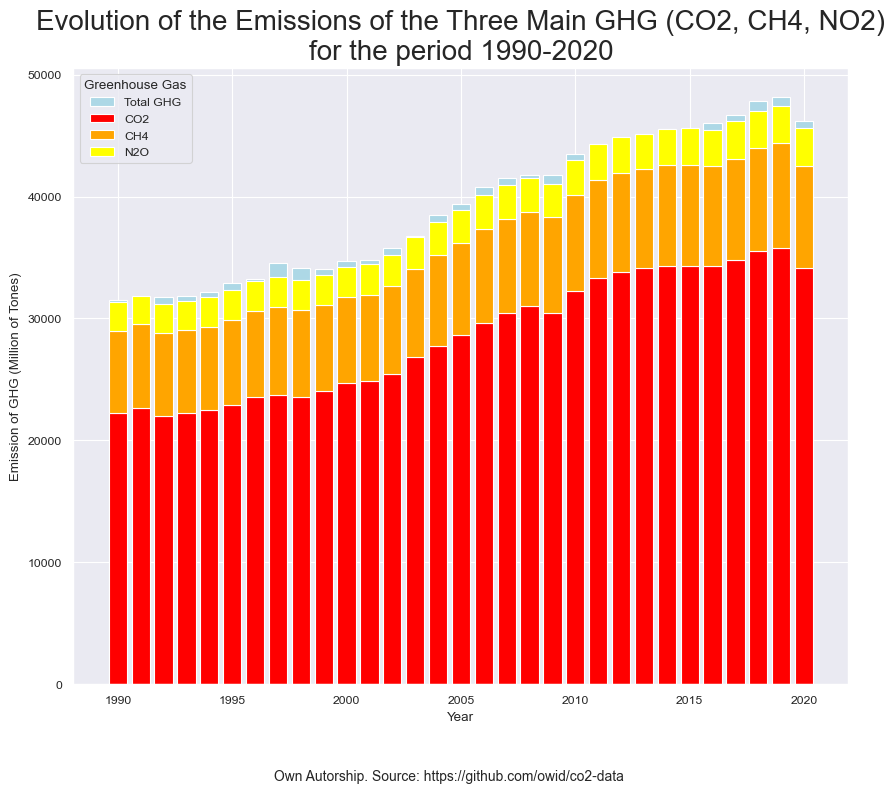

In [96]:
#Ploting the emissions

plt.figure(figsize=(10, 8))
plt.bar(total_emissions['year'], total_emissions['total_ghg'], label='Total GHG', color='lightblue')
plt.bar(total_emissions['year'], total_emissions['co2'], label='CO2', color='red')
plt.bar(total_emissions['year'], total_emissions['methane'], bottom=total_emissions['co2'], label='CH4', color='orange')
plt.bar(total_emissions['year'], total_emissions['nitrous_oxide'], bottom=total_emissions['co2'] + total_emissions['methane'], label='N2O', color='yellow')
plt.legend('Greenhouse Gas')
plt.title('Evolution of the Emissions of the Three Main GHG (CO2, CH4, NO2)\nfor the period 1990-2020', fontsize=20)
plt.xlabel('Year')
plt.ylabel('Emission of GHG (Million of Tones)')
plt.figtext(0.5, -0.01, note, ha='center', fontsize=10)
plt.legend(title='Greenhouse Gas')
plt.show()

2.6. Analyzing the variations of the temperature through the year.

2.6.1. Data modeling and preparation.

In [ ]:
#Data manipulation and previous modifications

data_temp_change_land_per_country_month = data_temp_change_land_per_country_month.apply(standardize_country_name)

group_list = [ocde, europe, north_america, south_america, africa, asia, oceania]

group_names = ['OCDE', 'Europe', 'North America', 'South America', 'Africa', 'Asia', 'Oceania']

groups_2_cols = [europe, africa, asia]

for group in group_list:
    globals()[f'data_temp_change_land_per_country_month_filtered_{group}'] = data_temp_change_land_per_country_month[(data_temp_change_land_per_country_month['Country'].isin(group)) &
                                                                                  (~data_temp_change_land_per_country_month['Month'].isin(['Meteorological year'])) &
                                                                                  (data_temp_change_land_per_country_month['Year'] == 2020)]

2.6.2. Developing the visualizations.

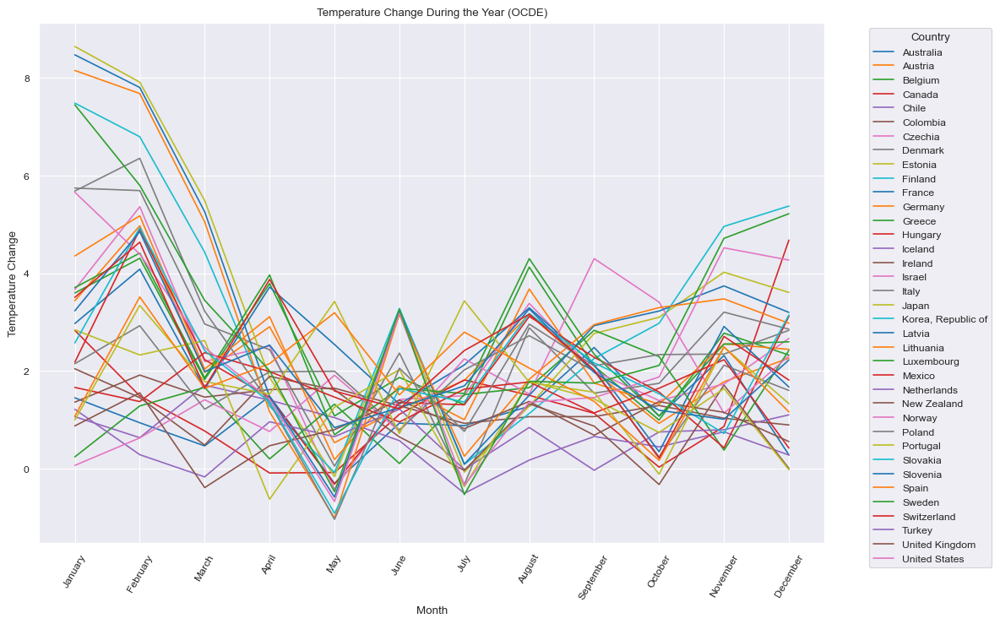

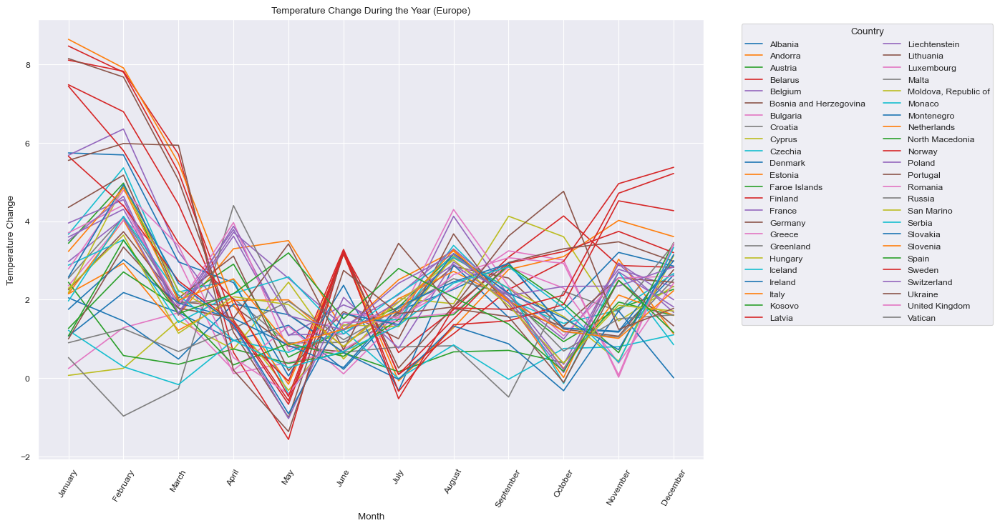

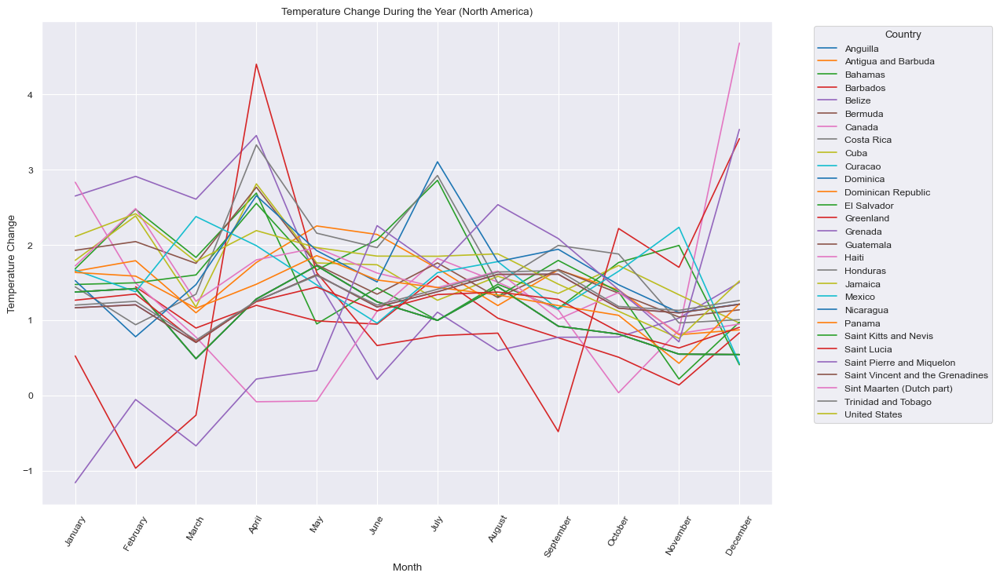

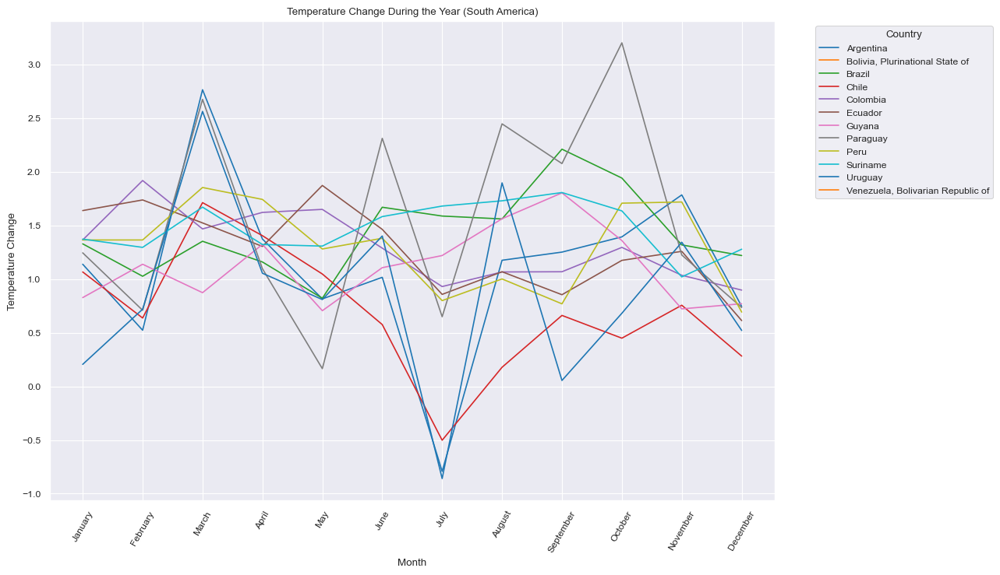

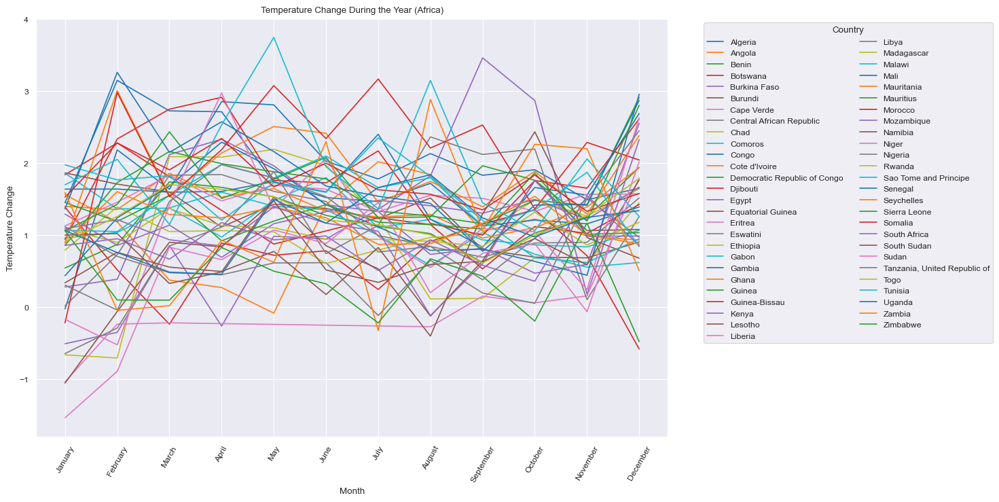

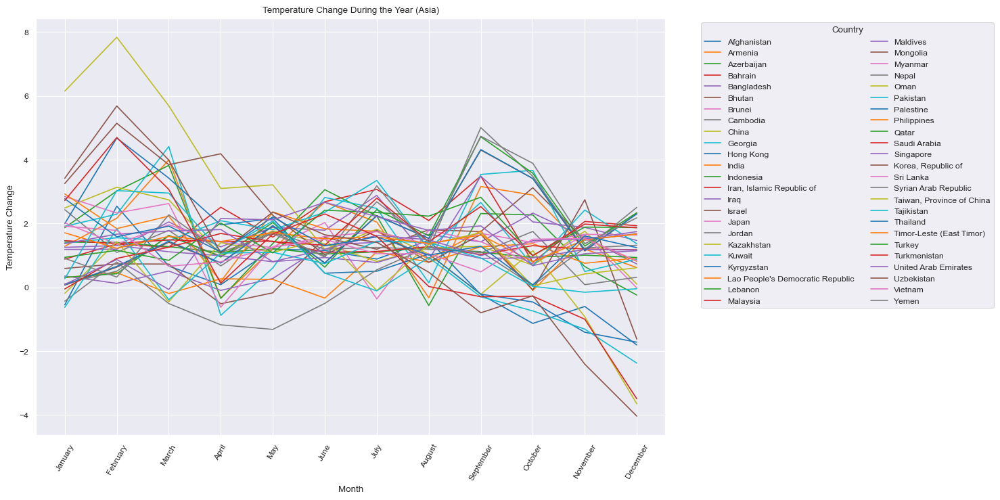

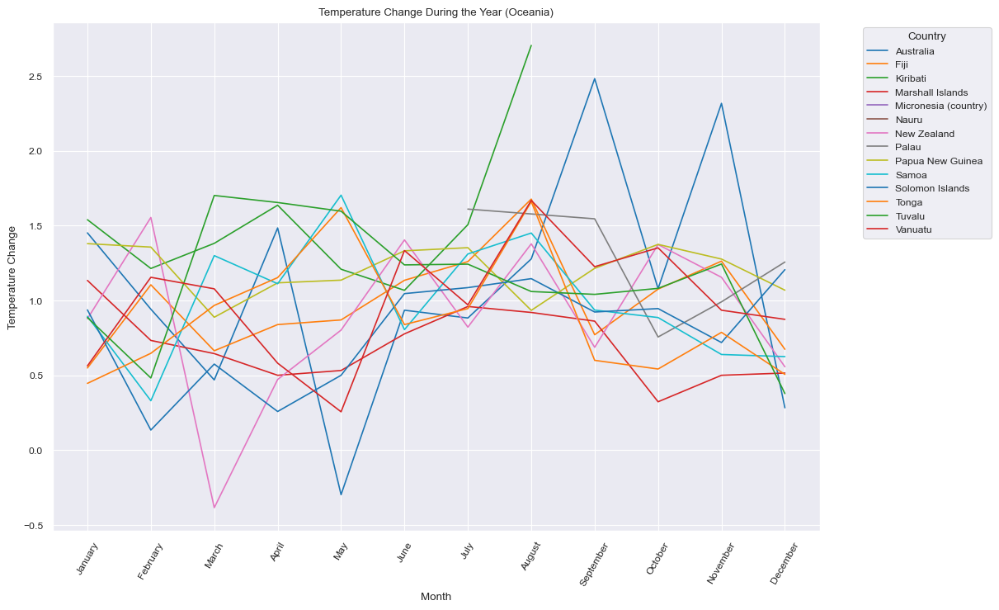

In [97]:
#Generating the plots for different regions

#Plotting the temperatures variations for OCDE countries

x = 0

for group in group_list:
        
    plt.figure(figsize=(12, 8))

    for country in group:
        sns.lineplot(x='Month', y='Temperature Change', data=globals()[f'data_temp_change_land_per_country_month_filtered_{group}'][globals()[f'data_temp_change_land_per_country_month_filtered_{group}']['Country']==country], label=country, markers='o')
    
    if group in groups_2_cols:

        plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
        plt.title(f'Temperature Change During the Year ({group_names[x]})')
        plt.xticks(rotation=60)
        plt.show()

        x = x + 1

    else:

        plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.title(f'Temperature Change During the Year ({group_names[x]})')
        plt.xticks(rotation=60)
        plt.show()

        x = x + 1

3. Analyzing the heat anomalities in the ocean per region.

3.1. Developing the visualizations.

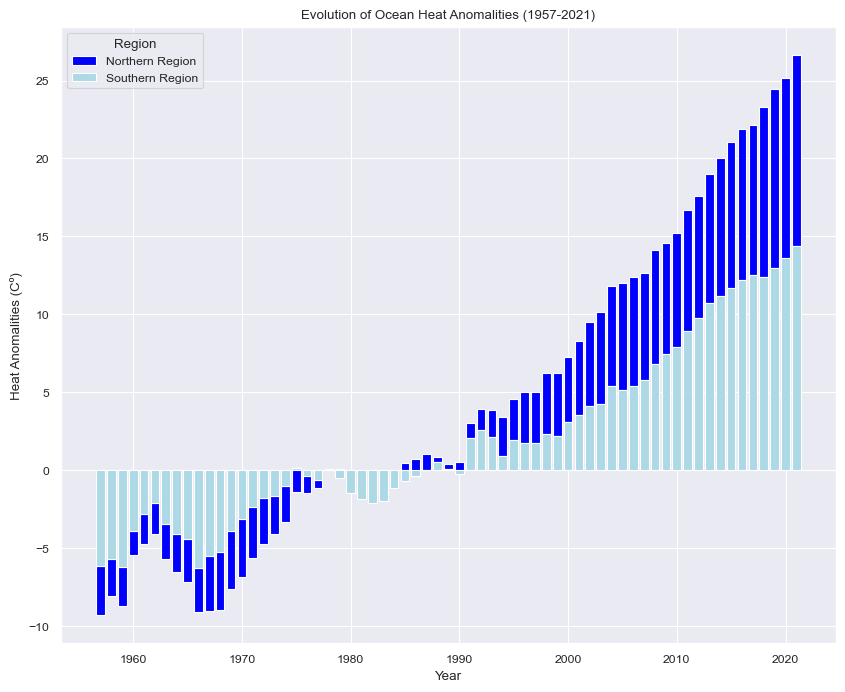

In [98]:
plt.figure(figsize=(10, 8))
plt.bar(data_ocean_heat_anomalities_per_region['Year'], data_ocean_heat_anomalities_per_region['NH_ocean_heat_content_anomaly'], bottom=data_ocean_heat_anomalities_per_region['SH_ocean_heat_content_anomaly'], label='Northern Region', color='blue')
plt.bar(data_ocean_heat_anomalities_per_region['Year'], data_ocean_heat_anomalities_per_region['SH_ocean_heat_content_anomaly'], label='Southern Region', color='lightblue')
plt.title('Evolution of Ocean Heat Anomalities (1957-2021)')
plt.ylabel('Heat Anomalities (Cº)')
plt.legend(title='Region')
plt.xlabel('Year')
plt.show()

4. Analyzing the origin of the emissions (economic and other activities).

4.1. Data modeling and preparation.

In [99]:
#Loading the dataframes

ghg_emissions_by_sector = pd.DataFrame(pd.read_excel(".../ghg-emissions-by-sector.xlsx"))
co2_emissions_by_sector = pd.DataFrame(pd.read_excel(".../co2-emissions-by-sector.xlsx"))
nitrous_oxide_emissions_by_sector = pd.DataFrame(pd.read_excel(".../nitrous-oxide-emissions-by-sector.xlsx"))
methane_emissions_by_sector = pd.DataFrame(pd.read_excel(".../methane-emissions-by-sector.xlsx"))

#Filtering Dataframes

df_list = [ghg_emissions_by_sector, co2_emissions_by_sector, nitrous_oxide_emissions_by_sector, methane_emissions_by_sector]
df_names = ['ghg_emissions_by_sector', 'co2_emissions_by_sector', 'nitrous_oxide_emissions_by_sector', 'methane_emissions_by_sector']
df_filtered = []
df_names_filtered = []

for df, name in zip(df_list, df_names):
    globals()[f'{name}_world_2020'] = df[(df['Year'] == 2020) & (df['Entity'] == 'World')].drop('Code', axis=1)
    df_filtered.append(globals()[f'{name}_world_2020'])
    df_names_filtered.append(f'{name}_world_2020')

#Meltin Dataframes

col_list_ghg = ghg_emissions_by_sector.columns.to_list()
col_list_co2 = co2_emissions_by_sector.columns.to_list()
col_list_nitrous_oxide = nitrous_oxide_emissions_by_sector.columns.to_list()
col_list_methane = methane_emissions_by_sector.columns.to_list()

list_of_lists = [col_list_ghg, col_list_co2, col_list_nitrous_oxide, col_list_methane]

list_of_col_lists = []

for list in list_of_lists:
    globals()[f'{list}'] = list[3:]
    list_of_col_lists.append(globals()[f'{list}'])

melted_df_list = []

for df, name, list in zip(df_filtered, df_names_filtered, list_of_col_lists):
    globals()[name + '_melted'] = pd.melt(df, id_vars=['Entity', 'Year'], var_name='Sector', value_name='Emissions')
    melted_df_list.append(globals()[name + '_melted'])

4.2. Developing the visualizations.

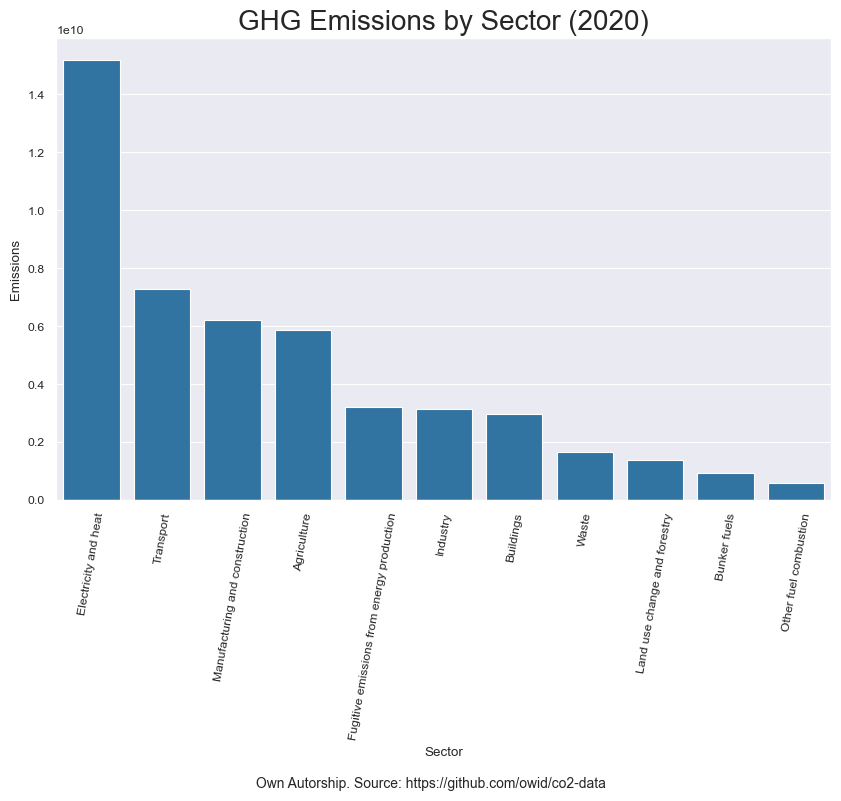

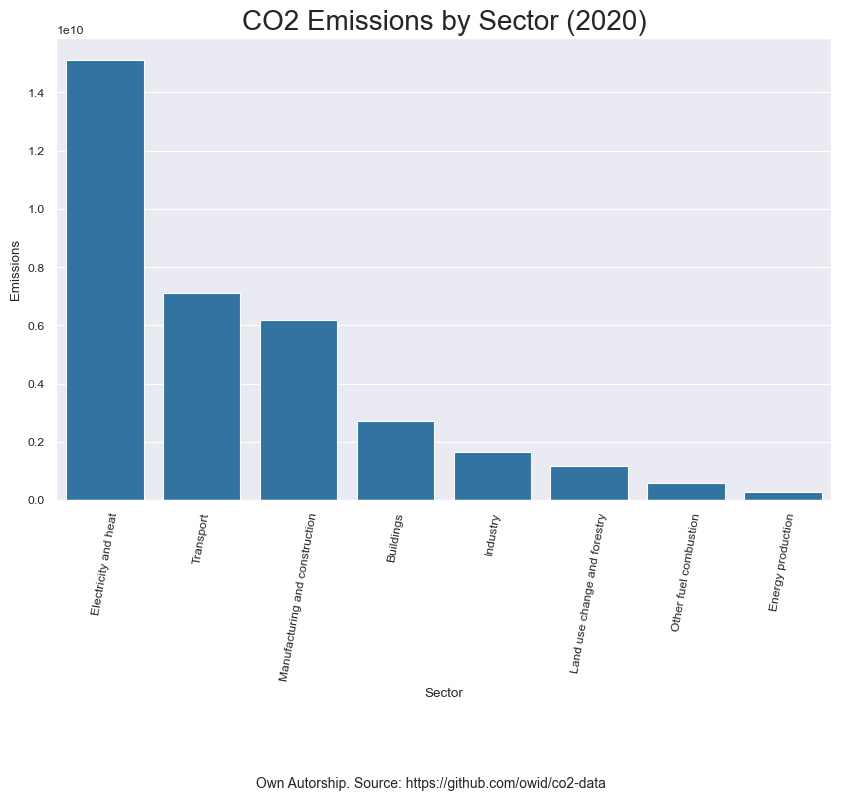

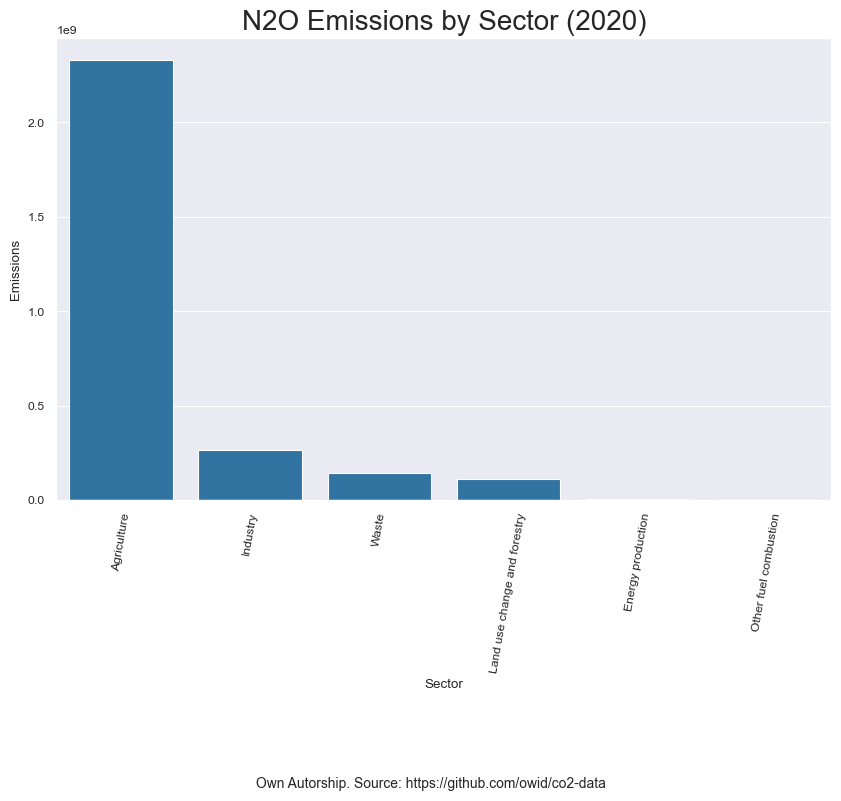

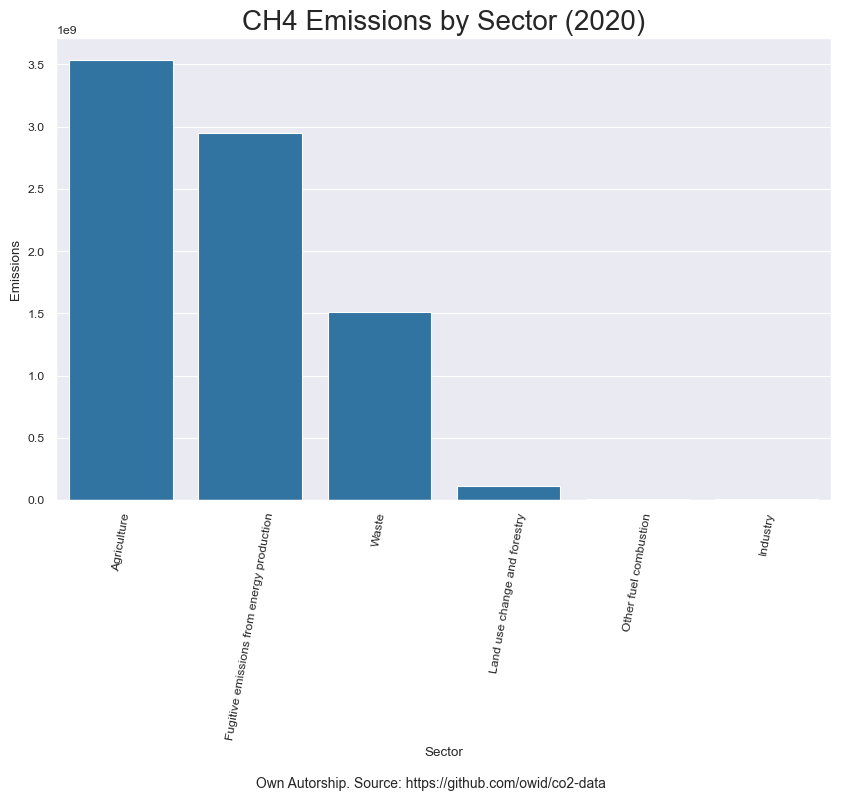

In [132]:
#Plotting the the origin of the emissions

title_list = ['GHG Emissions by Sector (2020)',
              'CO2 Emissions by Sector (2020)',
              'N2O Emissions by Sector (2020)',
              'CH4 Emissions by Sector (2020)']

for df, title in zip(melted_df_list, title_list):
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Sector', y='Emissions', data=df.sort_values(by='Emissions', ascending=False))
    plt.xticks(rotation=80)
    plt.title(title, fontsize=20)
    plt.xlabel('Sector')
    plt.ylabel('Emissions')
    plt.figtext(0.5, -0.37, note, ha='center', fontsize=10)
    plt.show()
 